In [1]:
import numpy as np;
import pandas as pd;
import matplotlib.pyplot as plt;
import seaborn as sns;

# Unilever Data Science POC Use Case
## Goal - 
### Problem Definition: 
One of our brands is going through some major changes in business execution plans and will like to know.
1. What are the major drivers for sales(EQ)?
2. Knowing the drivers, how accurately we can predict future sales for next 6 periods?

In [2]:
sales_df = pd.read_csv("Training-Data-Sets - NEWDATA.csv")

In [3]:
sales_df.head()

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,Magazine_Impressions_pct,TV_GRP,Competitor1_RPI,Competitor2_RPI,Competitor3_RPI,Competitor4_RPI,EQ_Category,EQ_Subcategory,pct_PromoMarketDollars_Subcategory,RPI_Subcategory
0,1,718.458667,22256928,56812,7724107,238700,151438,1044,112229070,2133614,...,54.17,16.46,105.71,36.13,46.36,71.83,5420048,475559,0.3766,45.77
1,2,25.521137,4239408,105695,5844288,188902,264008,113582,284597324,1719318,...,65.79,15.64,111.79,43.31,47.58,67.90,12155631,371540,0.2515,35.02
2,3,268.288044,6708500,87686,13008485,19704,150505,38501,807781054,1569740,...,45.08,23.91,110.15,38.26,49.26,72.70,11939870,225984,0.3679,46.22
3,4,209.071599,36835247,70791,2520814,200111,253458,53719,667441334,922723,...,75.24,13.06,116.74,39.37,44.21,73.01,7045541,551342,0.0504,38.10
4,5,3482.169185,23693467,75610,9276779,65532,278877,95178,74045467,1834970,...,56.85,40.72,115.18,36.85,45.46,75.84,11488805,254143,0.2219,39.16


In [4]:
sales_df.shape

(12000, 39)

Check if there are null data, there are no null data.

In [5]:
sales_df.isnull().sum()

Day                                   0
EQ                                    0
Social_Search_Impressions             0
Social_Search_Working_cost            0
Digital_Impressions                   0
Digital_Working_cost                  0
Print_Impressions.Ads40               0
Print_Working_Cost.Ads50              0
OOH_Impressions                       0
OOH_Working_Cost                      0
SOS_pct                               0
Digital_Impressions_pct               0
CCFOT                                 0
Median_Temp                           0
Median_Rainfall                       0
Fuel_Price                            0
Inflation                             0
Trade_Invest                          0
Brand_Equity                          0
Avg_EQ_Price                          0
Any_Promo_pct_ACV                     0
Any_Feat_pct_ACV                      0
Any_Disp_pct_ACV                      0
EQ_Base_Price                         0
Est_ACV_Selling                       0


Lets check if correct data type is assigned to the given columns

In [6]:
sales_df.dtypes

Day                                     int64
EQ                                    float64
Social_Search_Impressions               int64
Social_Search_Working_cost              int64
Digital_Impressions                     int64
Digital_Working_cost                    int64
Print_Impressions.Ads40                 int64
Print_Working_Cost.Ads50                int64
OOH_Impressions                         int64
OOH_Working_Cost                        int64
SOS_pct                                 int64
Digital_Impressions_pct                 int64
CCFOT                                   int64
Median_Temp                             int64
Median_Rainfall                       float64
Fuel_Price                            float64
Inflation                             float64
Trade_Invest                            int64
Brand_Equity                          float64
Avg_EQ_Price                          float64
Any_Promo_pct_ACV                     float64
Any_Feat_pct_ACV                  

None of them are in the format of object, thus we can continue our analysis

## Initial Exploratory Data Analysis

Lets create a list of all the valuable variables and null hypothesis that can be looked into.
1. At first look the following variables should be good predictors of EQ:
    1. Shopper.marketing.cp - consumer promotion, more the promotion is targetted to the customer, more should be sales.
    2. CCFOT - customer quantity filled on time. More happy the customer better should be sales.
    3. Plan.Invest - Trade Promotion.
    4. Avg.EQ.Price - Lower the price better should be the sales.
    5. Avg.EQ.Price and competitor1-RPI can be compared to check if EQ sales are getting affected by it.
    6. pct.promo.Market.Dollars & pct_PromoMarketDollars_subcat - % of dollar on promotion in a category/subcategory should determine better EQ.
<br />
2. There are also some corelated important properties:
    1. SOS_pct, Mag.IMpressions_pct & TV_SOV_Pct - They are marketing spends associated with Magazine,TV or overall marketing spends.
    2. Median.Temp, Trip.Conversion, Total.Units.PerItemTrip & Avg.of.Items- are all delivery related properties. The Avg.of.Items is good property to recognize the items which are not selling well.
    3. Shopper.Marketing.CP, Plan.Invest - Promotions targetted towards customers and market as a whole.
    4. pct.promo.Market.Dollars & pct_PromoMarketDollars_subcat - are important indicators for overall costs for the given marketing.
    5. EQ_masterCategory & EQ_subcategory - total category volume produced.

Lets go over the data to understand if there any categorical data present, especially to recognize the categories of products.

In [7]:
sales_df.head()

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,Magazine_Impressions_pct,TV_GRP,Competitor1_RPI,Competitor2_RPI,Competitor3_RPI,Competitor4_RPI,EQ_Category,EQ_Subcategory,pct_PromoMarketDollars_Subcategory,RPI_Subcategory
0,1,718.458667,22256928,56812,7724107,238700,151438,1044,112229070,2133614,...,54.17,16.46,105.71,36.13,46.36,71.83,5420048,475559,0.3766,45.77
1,2,25.521137,4239408,105695,5844288,188902,264008,113582,284597324,1719318,...,65.79,15.64,111.79,43.31,47.58,67.90,12155631,371540,0.2515,35.02
2,3,268.288044,6708500,87686,13008485,19704,150505,38501,807781054,1569740,...,45.08,23.91,110.15,38.26,49.26,72.70,11939870,225984,0.3679,46.22
3,4,209.071599,36835247,70791,2520814,200111,253458,53719,667441334,922723,...,75.24,13.06,116.74,39.37,44.21,73.01,7045541,551342,0.0504,38.10
4,5,3482.169185,23693467,75610,9276779,65532,278877,95178,74045467,1834970,...,56.85,40.72,115.18,36.85,45.46,75.84,11488805,254143,0.2219,39.16


In [8]:
sales_df.columns

Index(['Day', 'EQ', 'Social_Search_Impressions', 'Social_Search_Working_cost',
       'Digital_Impressions', 'Digital_Working_cost',
       'Print_Impressions.Ads40', 'Print_Working_Cost.Ads50',
       'OOH_Impressions', 'OOH_Working_Cost', 'SOS_pct',
       'Digital_Impressions_pct', 'CCFOT', 'Median_Temp', 'Median_Rainfall',
       'Fuel_Price', 'Inflation', 'Trade_Invest', 'Brand_Equity',
       'Avg_EQ_Price', 'Any_Promo_pct_ACV', 'Any_Feat_pct_ACV',
       'Any_Disp_pct_ACV', 'EQ_Base_Price', 'Est_ACV_Selling', 'pct_ACV',
       'Avg_no_of_Items', 'pct_PromoMarketDollars_Category', 'RPI_Category',
       'Magazine_Impressions_pct', 'TV_GRP', 'Competitor1_RPI',
       'Competitor2_RPI', 'Competitor3_RPI', 'Competitor4_RPI', 'EQ_Category',
       'EQ_Subcategory', 'pct_PromoMarketDollars_Subcategory',
       'RPI_Subcategory'],
      dtype='object')

From the above the columns it looks like the data columns are not same as Data Dictionary.

From the above columns, lets fetch gropued data:

| Primary Columns | RelatedColumns |
|-----------------|-------------------------------------|
| Social_search_Impressions | Social_Search_Working_cost |
| Digital_Impressions | Digital_Working_cost, Digital_Impressions_pct |
| Print_Impressions.Ads40 | Print_Working_Cost.Ads50 |
| OOH_Impressions | OOH_Working_Cost |
| DeliveryRelatedFields | CCFOT, Median_Temp, Median_Rainfall, Fuel_Price, Inflation, Avg_no_of_Items  |
| Competitor1_RPI | Competitor2_RPI, Competitor3_RPI, Competitor4_RPI  |
| EQ_Base_Price, EQ_Category | EQ_Subcategory, Avg_EQ_Price  |
| RPI - Retail Price Index RPI_Category | RPI_Subcategory  |
| pct_PromoMarketDollars_Category | pct_PromoMarketDollars_Subcategory  |
| SOS_pct | Share of spends Percentage |
| Trade_Invest |  |
| Brand_Equity |  |
| ACV - All Commodity Volumns | Any_Promo_pct_ACV, Any_Feat_pct_ACV, Any_Disp_pct_ACV, Est_ACV_Selling, pct_ACV  |
| Magazine_Impressions_pct |  |
| TV_GRP |  |

Amoung the above the variables can be divided into marketing related - 
1. SocialSearchImpression
2. DigitalImpression.
3. PrintImpressions
4. OOHImpressions
5. PromoMarketDollars
6. MagazineImpressions
7. TV_GRP
and the rest of the variables which are actual product and service related fields.

In [9]:
len(sales_df.columns)

39

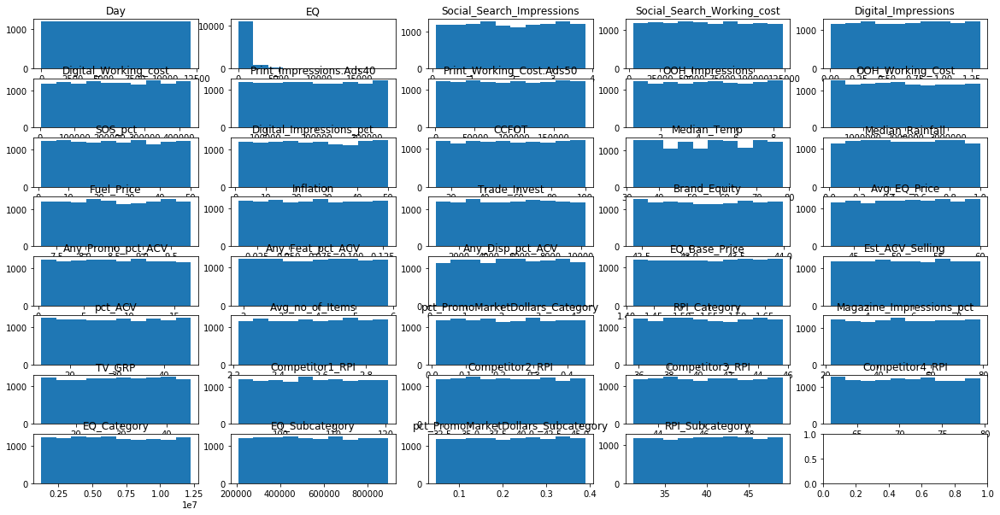

In [10]:
fig, axes = plt.subplots(nrows=8, ncols=5)
fig.set_figheight(10)
fig.set_figwidth(20)
intitalVal2 = 0;
for col in sales_df.columns:
    #print(intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) ))
    
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].hist(sales_df[col])
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].set_title(col)
    intitalVal2 = intitalVal2+1

Here we see that the data is uniformly distributed, Either we use np.log1p to convert the data or use Box-Muller Transformation to transform the data.
1. np.log1p - Return the natural logarithm of one plus the input array, element-wise. Calculates log(1 + x). Inverse Transform Sampling
2. Reciprocal 
3. np.log2

https://www.statisticshowto.datasciencecentral.com/transformation-statistics/

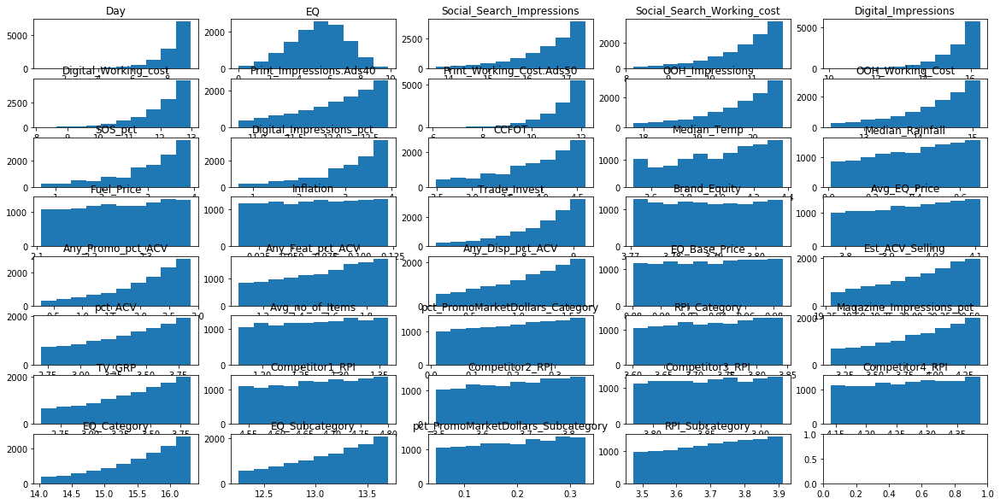

In [11]:
fig, axes = plt.subplots(nrows=8, ncols=5)
fig.set_figheight(10)
fig.set_figwidth(20)
intitalVal2 = 0;
for col in sales_df.columns:
    #print(intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) ))
    
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].hist(np.log1p(sales_df[col]))
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].set_title(col)
    intitalVal2 = intitalVal2+1

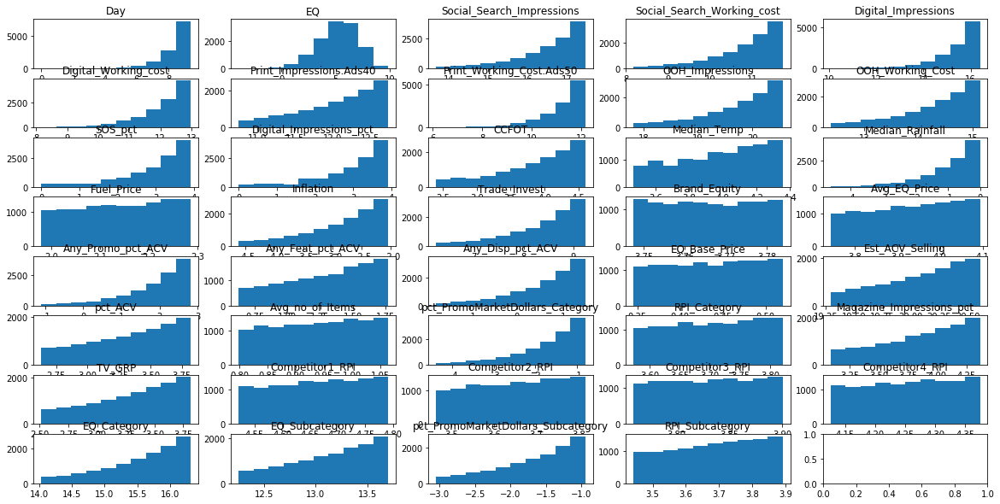

In [12]:
fig, axes = plt.subplots(nrows=8, ncols=5)
fig.set_figheight(10)
fig.set_figwidth(20)
intitalVal2 = 0;
for col in sales_df.columns:
    #print(intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) ))
    
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].hist(np.log(sales_df[col]))
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].set_title(col)
    intitalVal2 = intitalVal2+1

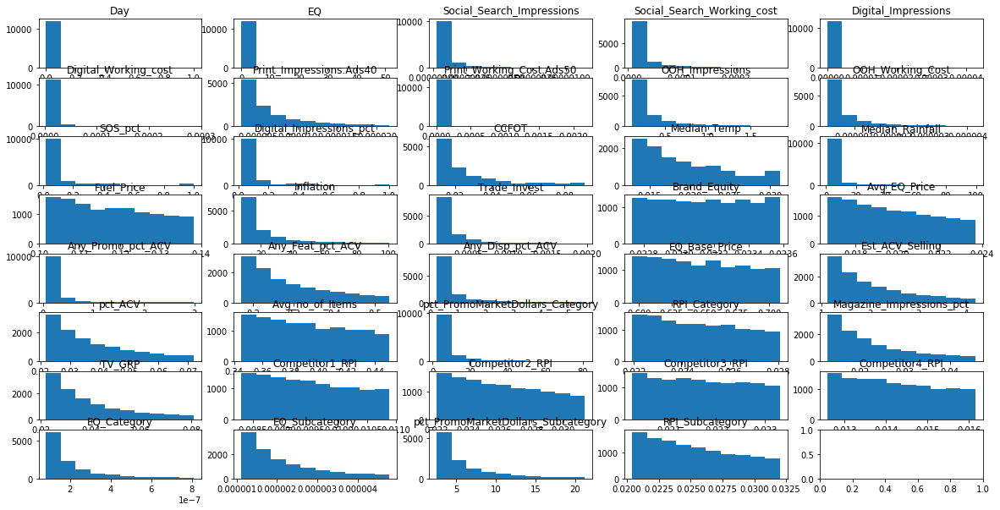

In [13]:
fig, axes = plt.subplots(nrows=8, ncols=5)
fig.set_figheight(10)
fig.set_figwidth(20)
intitalVal2 = 0;
for col in sales_df.columns:
    #print(intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) ))
    
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].hist(1/sales_df[col])
    axes[intitalVal2//5, (intitalVal2- ((intitalVal2//5)*5) )].set_title(col)
    intitalVal2 = intitalVal2+1

Lets convert all the columns into its Log inverse transform to allow better analysis

In [14]:
convertedSales_df = sales_df.copy()
for col in convertedSales_df.columns:
    convertedSales_df[col] = np.log1p(convertedSales_df[col])

In [15]:
convertedSales_df.head()

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,Magazine_Impressions_pct,TV_GRP,Competitor1_RPI,Competitor2_RPI,Competitor3_RPI,Competitor4_RPI,EQ_Category,EQ_Subcategory,pct_PromoMarketDollars_Subcategory,RPI_Subcategory
0,0.693147,6.578499,16.918164,10.947520,15.859857,12.382967,11.927938,6.951772,18.536053,14.573328,...,4.010419,2.859913,4.670115,3.614425,3.857778,4.288128,15.505615,13.072248,0.319617,3.845242
1,1.098612,3.277942,15.259934,11.568322,15.580976,12.148989,12.483738,11.640289,19.466586,14.357439,...,4.201553,2.811809,4.725528,3.791210,3.883212,4.232656,16.313303,12.825415,0.224343,3.584074
2,1.386294,5.595782,15.718886,11.381529,16.381112,9.888628,11.921758,10.558465,20.509802,14.266421,...,3.830379,3.215269,4.710881,3.670206,3.917210,4.300003,16.295394,12.328224,0.313277,3.854818
3,1.609438,5.347448,17.421966,11.167501,14.740093,12.206632,12.442957,10.891541,20.318962,13.735085,...,4.333886,2.643334,4.768479,3.698087,3.811318,4.304200,15.767906,13.220112,0.049171,3.666122
4,1.791759,8.155698,16.980710,11.233357,16.043025,11.090309,12.538530,11.463515,18.120190,14.422539,...,4.057853,3.730981,4.755141,3.633631,3.838592,4.341725,16.256884,12.445656,0.200407,3.692871


Among all these variables Day is a unique quantity that represents probably the days since the given items were observed. Can be left as is or dropped.

In [16]:
convertedSales_df[["Day", "Social_Search_Impressions", "Social_Search_Working_cost"]]

,Day,Social_Search_Impressions,Social_Search_Working_cost
0,0.693147,16.918164,10.947520
1,1.098612,15.259934,11.568322
2,1.386294,15.718886,11.381529
3,1.609438,17.421966,11.167501
4,1.791759,16.980710,11.233357
...,...,...,...
11995,9.392412,17.064753,11.490046
11996,9.392495,17.438701,11.058039
11997,9.392579,17.033684,11.707826
11998,9.392662,17.376952,10.761980


In [17]:
convertedSales_df[["Social_Search_Impressions", "Social_Search_Working_cost"]].describe()

,Social_Search_Impressions,Social_Search_Working_cost
count,12000.000000,12000.000000
mean,16.550591,10.822482
std,0.811199,0.784905
min,13.680964,8.173857
25%,16.139259,10.409250
50%,16.785647,11.049134
75%,17.187572,11.434561
max,17.460239,11.723365


In [18]:
len(convertedSales_df['RPI_Category'].unique())

7007

In [19]:
len(convertedSales_df['RPI_Subcategory'].unique())

1779

Here we see that RPI_Category and RPI_SubCategory are probably categorical values.

In [20]:
convertedSales_df[["EQ_Base_Price", "EQ_Category", "EQ_Subcategory", "Avg_EQ_Price"]]

,EQ_Base_Price,EQ_Category,EQ_Subcategory,Avg_EQ_Price
0,0.985444,15.505615,13.072248,3.786233
1,0.976068,16.313303,12.825415,3.812424
2,0.963174,16.295394,12.328224,3.898532
3,0.963174,15.767906,13.220112,4.096010
4,0.889536,16.256884,12.445656,3.901973
...,...,...,...,...
11995,0.936093,15.928487,13.034330,4.019262
11996,0.938835,15.313358,13.036468,3.827771
11997,0.898127,14.270359,13.242389,3.897112
11998,0.905836,16.055274,13.275474,4.010782


In [21]:
len(convertedSales_df["EQ_Category"].unique())

11987

In [22]:
len(convertedSales_df["EQ_Subcategory"].unique())

11899

Here we see that EQ_Category and EQ_SubCategory are not category values. But according to dictionary, they are the Total Category Volumne and Total Sub Category Volume.

In [23]:
len(convertedSales_df["TV_GRP"].unique())

3236

First lets see if the Impressions and the WorkingCost variables for each of the marketing are corelated.

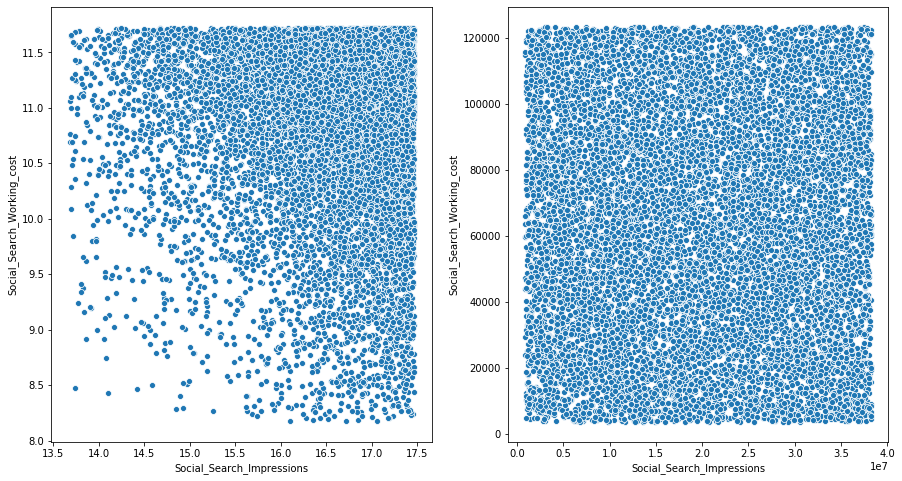

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.scatterplot(x="Social_Search_Impressions", y="Social_Search_Working_cost", data=convertedSales_df, ax=axes[0])
sns.scatterplot(x="Social_Search_Impressions", y="Social_Search_Working_cost", data=sales_df, ax=axes[1])

there doesn't seem to be any relation between the SocialSearch Impressions and workingCost

In [25]:
convertedSales_df["Social_Search_Impressions_Bin"] = pd.cut(convertedSales_df["Social_Search_Impressions"], 10)
sales_df["Social_Search_Impressions_Bin"] = pd.cut(sales_df["Social_Search_Impressions"], 10)

In [26]:
convertedSales_df.head()

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,TV_GRP,Competitor1_RPI,Competitor2_RPI,Competitor3_RPI,Competitor4_RPI,EQ_Category,EQ_Subcategory,pct_PromoMarketDollars_Subcategory,RPI_Subcategory,Social_Search_Impressions_Bin
0,0.693147,6.578499,16.918164,10.947520,15.859857,12.382967,11.927938,6.951772,18.536053,14.573328,...,2.859913,4.670115,3.614425,3.857778,4.288128,15.505615,13.072248,0.319617,3.845242,"(16.704, 17.082]"
1,1.098612,3.277942,15.259934,11.568322,15.580976,12.148989,12.483738,11.640289,19.466586,14.357439,...,2.811809,4.725528,3.791210,3.883212,4.232656,16.313303,12.825415,0.224343,3.584074,"(15.193, 15.571]"
2,1.386294,5.595782,15.718886,11.381529,16.381112,9.888628,11.921758,10.558465,20.509802,14.266421,...,3.215269,4.710881,3.670206,3.917210,4.300003,16.295394,12.328224,0.313277,3.854818,"(15.571, 15.949]"
3,1.609438,5.347448,17.421966,11.167501,14.740093,12.206632,12.442957,10.891541,20.318962,13.735085,...,2.643334,4.768479,3.698087,3.811318,4.304200,15.767906,13.220112,0.049171,3.666122,"(17.082, 17.46]"
4,1.791759,8.155698,16.980710,11.233357,16.043025,11.090309,12.538530,11.463515,18.120190,14.422539,...,3.730981,4.755141,3.633631,3.838592,4.341725,16.256884,12.445656,0.200407,3.692871,"(16.704, 17.082]"


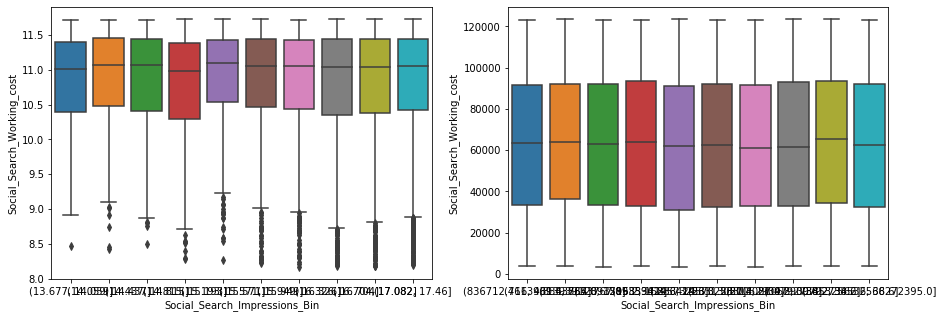

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.boxplot(x="Social_Search_Impressions_Bin", y="Social_Search_Working_cost", data=convertedSales_df, ax=axes[0])
sns.boxplot(x="Social_Search_Impressions_Bin", y="Social_Search_Working_cost", data=sales_df, ax=axes[1])

In [28]:
sales_df["Social_Search_WorkingCost_Bin"] = pd.cut(sales_df["Social_Search_Working_cost"], 10)
convertedSales_df["Social_Search_WorkingCost_Bin"] = pd.cut(convertedSales_df["Social_Search_Working_cost"], 10)

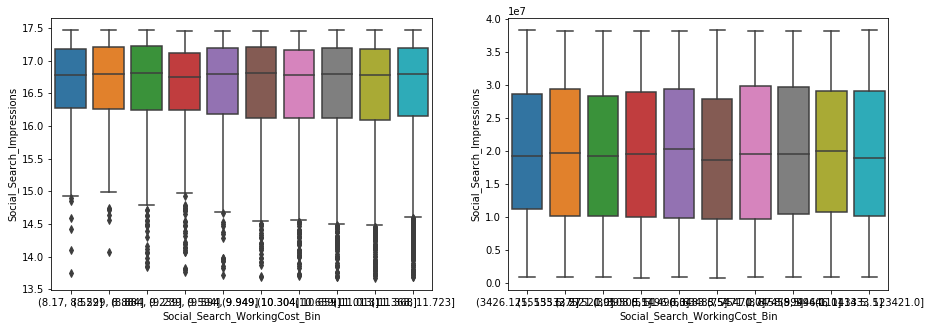

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.boxplot(x="Social_Search_WorkingCost_Bin", y="Social_Search_Impressions", data=convertedSales_df, ax=axes[0])
sns.boxplot(x="Social_Search_WorkingCost_Bin", y="Social_Search_Impressions", data=sales_df, ax=axes[1])

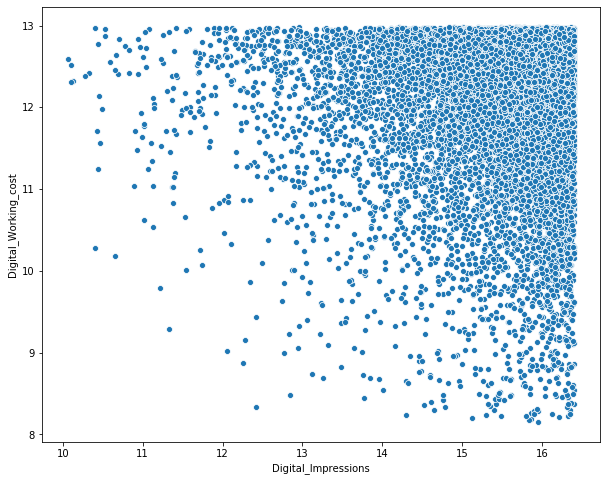

In [30]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x="Digital_Impressions", y="Digital_Working_cost", data=convertedSales_df)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 <a list of 50 Text xticklabel objects>)

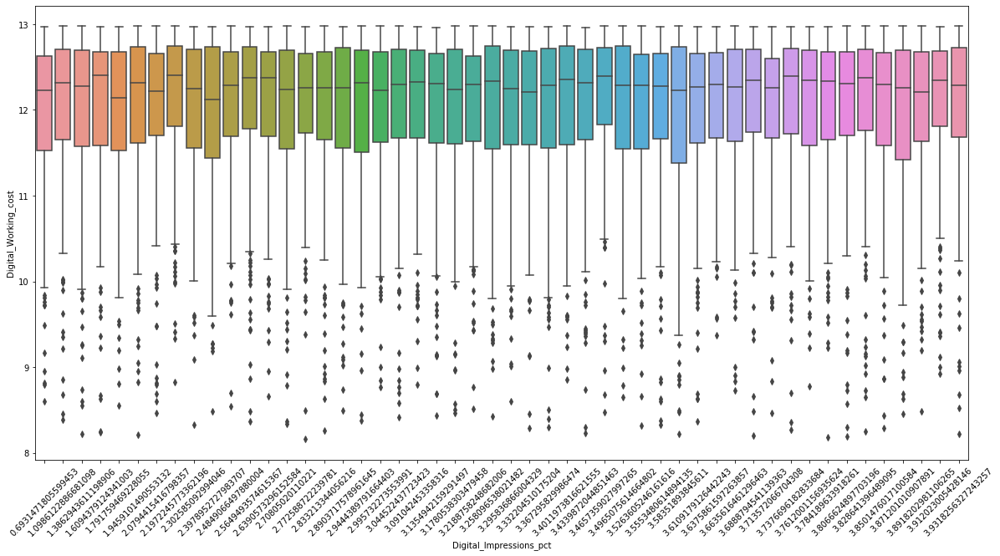

In [31]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="Digital_Impressions_pct", y="Digital_Working_cost", data=convertedSales_df)
plt.xticks(rotation=45)

Lets confirn Digital_Impressions_pct is percentage representation of Digital_Impressions

In [32]:
convertedSales_df[["Digital_Impressions_pct", "Digital_Impressions"]]

,Digital_Impressions_pct,Digital_Impressions
0,2.484907,15.859857
1,2.708050,15.580976
2,3.526361,16.381112
3,3.784190,14.740093
4,3.135494,16.043025
...,...,...
11995,2.484907,14.597142
11996,2.772589,16.325435
11997,3.295837,15.986371
11998,3.761200,16.369422


In [33]:
len(convertedSales_df["Digital_Impressions_pct"].unique())

50

In [34]:
convertedSales_df["Digital_Impressions_PCTCreated"] = pd.cut((convertedSales_df["Digital_Impressions"]/convertedSales_df["Digital_Impressions"].max())*100, 50, labels=list(range(1, 51)))

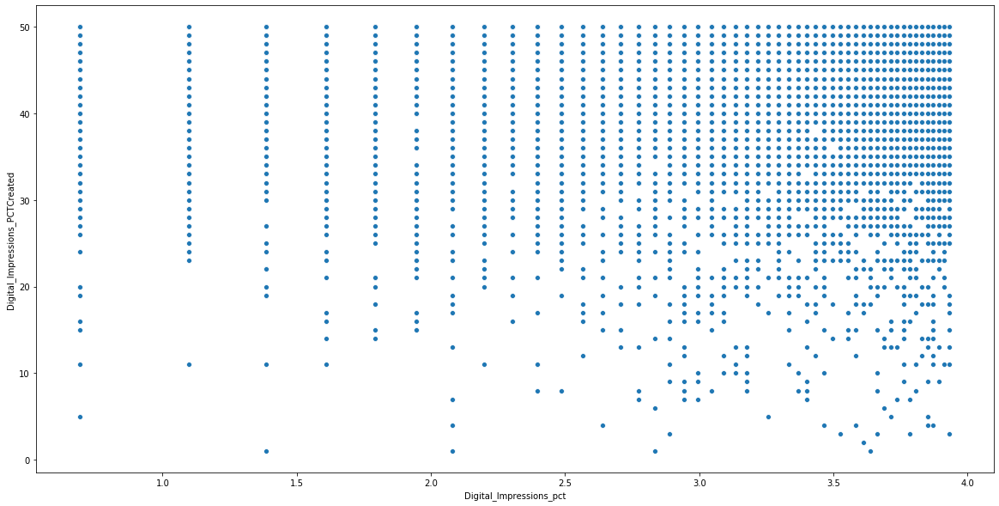

In [35]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="Digital_Impressions_pct", y="Digital_Impressions_PCTCreated", data=convertedSales_df)

there doesn't seem to be any corelation between pct(percentage) of Digital Impression and digital Impressions.

Lets look sat the corelation between working cost of all the different types of categories

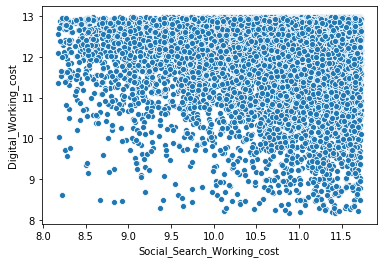

In [36]:
sns.scatterplot(x="Social_Search_Working_cost", y="Digital_Working_cost", data=convertedSales_df)

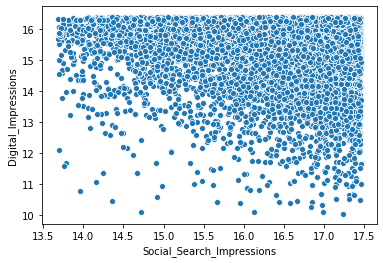

In [37]:
sns.scatterplot(x="Social_Search_Impressions", y="Digital_Impressions", data=convertedSales_df)

There is no corelation between the given values. Lets Try to check EQ variables

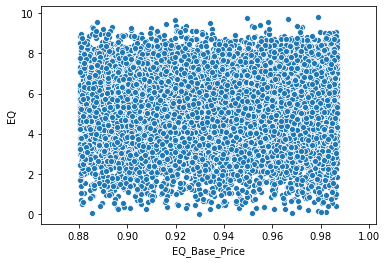

In [38]:
sns.scatterplot(x="EQ_Base_Price", y="EQ", data=convertedSales_df)

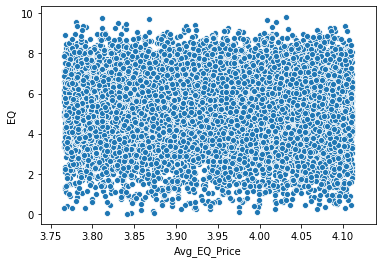

In [39]:
sns.scatterplot(x="Avg_EQ_Price", y="EQ", data=convertedSales_df)

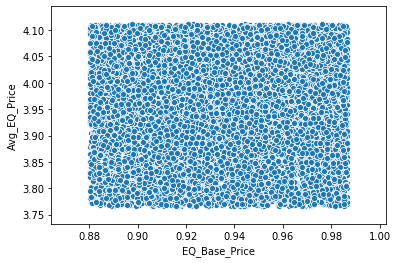

In [40]:
sns.scatterplot(x="EQ_Base_Price", y="Avg_EQ_Price", data=convertedSales_df)

Both the EQ_Base_Price and Avg_EQ_Price are showing similar graphs.

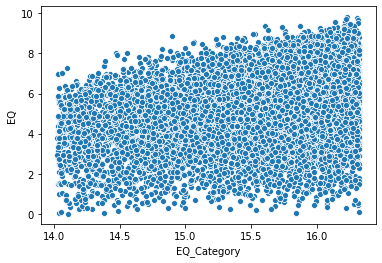

In [41]:
sns.scatterplot(x="EQ_Category", y="EQ", data=convertedSales_df)

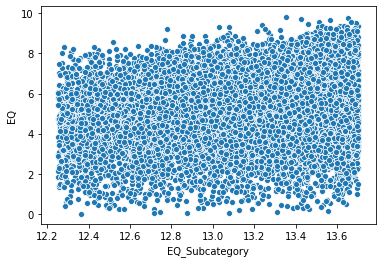

In [42]:
sns.scatterplot(x="EQ_Subcategory", y="EQ", data=convertedSales_df)

There seems to be a positive corelation between EQ and category and sub category

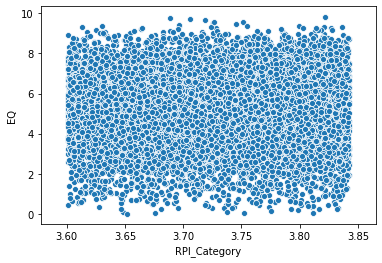

In [43]:
sns.scatterplot(x="RPI_Category", y="EQ", data=convertedSales_df)

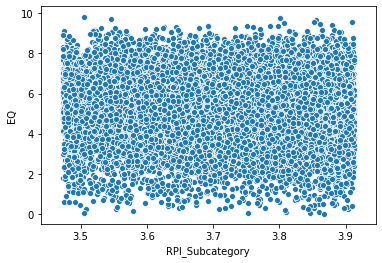

In [44]:
sns.scatterplot(x="RPI_Subcategory", y="EQ", data=convertedSales_df)

Lets analyse EQ only

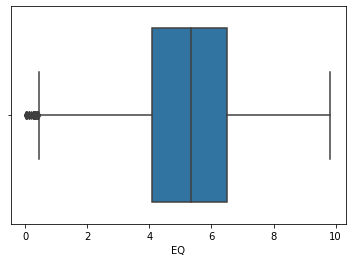

In [45]:
sns.boxplot(x=convertedSales_df["EQ"])

In [46]:
#Q1 = convertedSales_df["EQ"].quantile(0.25)
#Q3 = convertedSales_df["EQ"].quantile(0.75)
#IQR = Q3 - Q1

In [47]:
#salesEQ_filter = (sales_df["EQ"] >= (Q1 - 1.5*IQR)) & (sales_df["EQ"] <= (Q3 + 1.5*IQR))

In [48]:
#sns.boxplot(sales_df.loc[salesEQ_filter, "EQ"])

In [49]:
#sales_df["EQ"].describe()

In [50]:
#filteredSales_df = sales_df.loc[salesEQ_filter].copy()

During high Temp/Low Temp, or High Rainfall the sales might have been lower.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]),
 <a list of 47 Text xticklabel objects>)

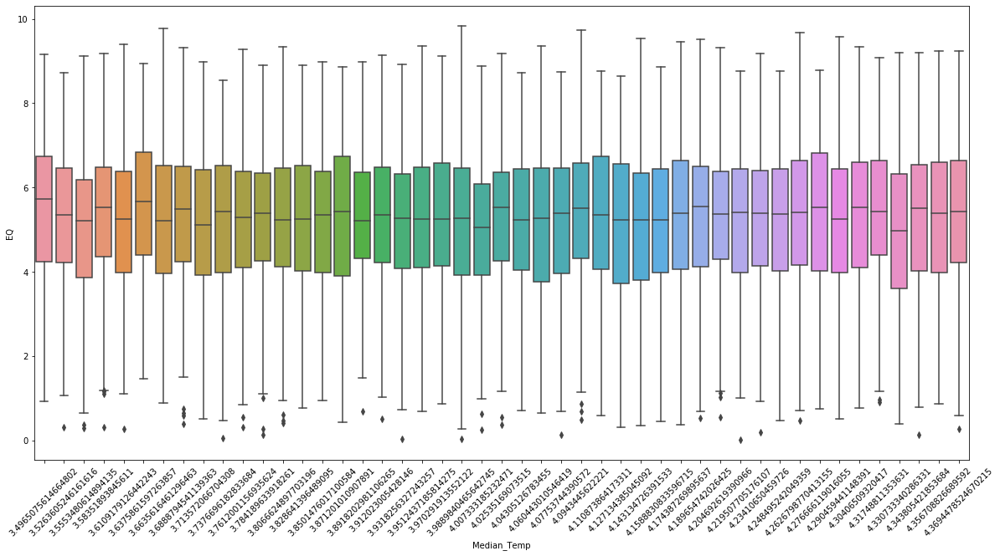

In [51]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="Median_Temp", y="EQ", data=convertedSales_df)
plt.xticks(rotation=45)

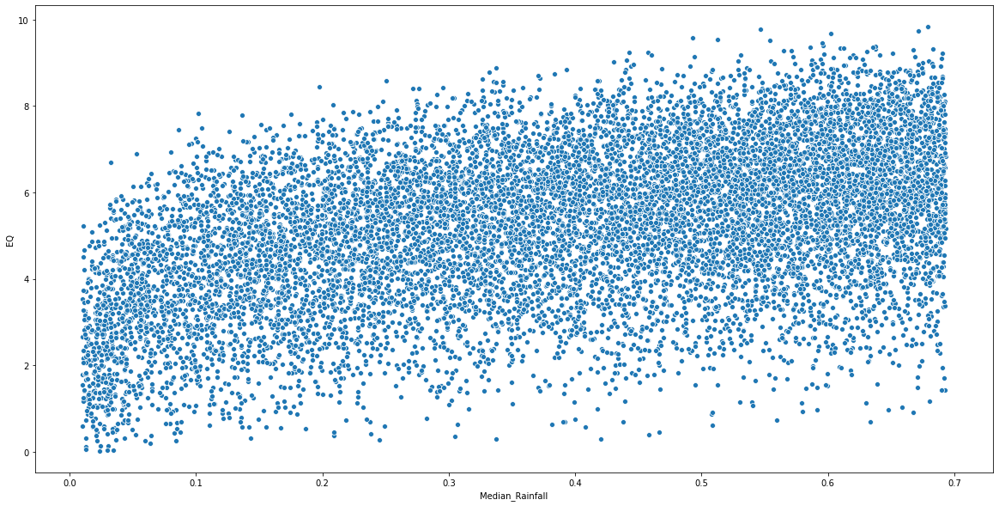

In [52]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="Median_Rainfall", y="EQ", data=convertedSales_df)

The median_rainfall shows different statistic that higher rainfall is causing more sales?

Try to create a corelation matrix to check if there are any obvious corelations which i am unable to catch

In [53]:
sales_corr = convertedSales_df.corr()

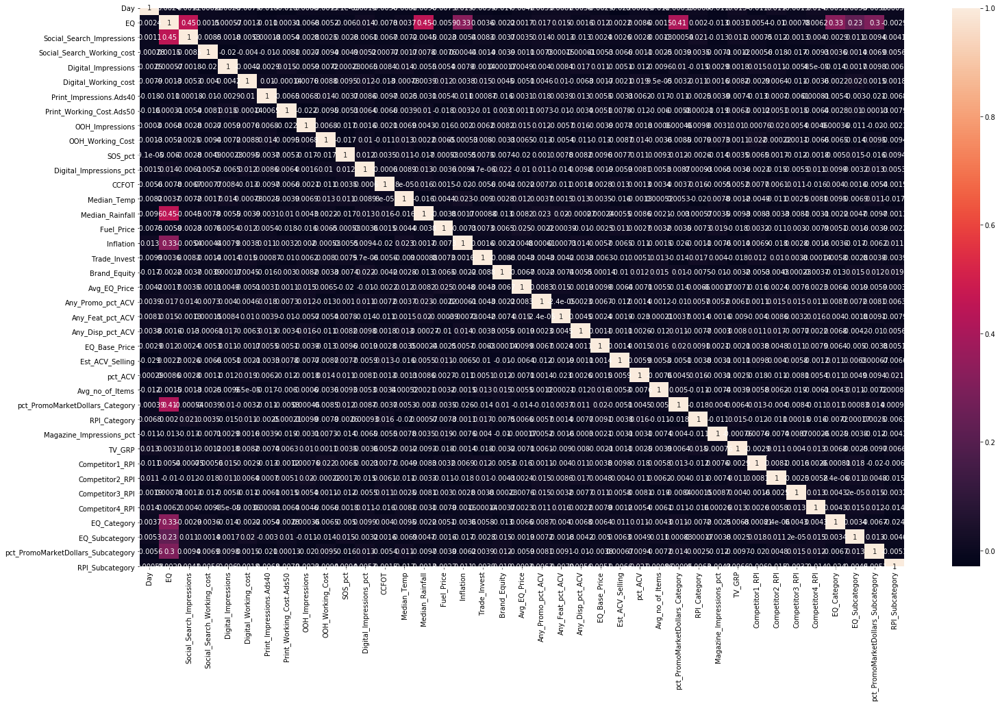

In [54]:
plt.figure(figsize=(25, 15))
sns.heatmap(sales_corr, annot=True)

Looking at this graph, it looks like only EQ is correlated:
1. EQ_Category
2. EQ_Subcategory
3. pct_Promo_MarketDollars_Subcategory
4. pct_Promo_MarketDollars_Category
5. Inflation
6. Median_Rainfall
7. Social_Search_Impressions

In [55]:
convertedSales_df["Social_Search_ImpressionsReturn"]= convertedSales_df["Social_Search_Impressions"]/convertedSales_df["Social_Search_Working_cost"]

In [56]:
convertedSales_df["Digital_ImpressionsReturn"] = convertedSales_df["Digital_Impressions"]/convertedSales_df["Digital_Working_cost"]
convertedSales_df["OOH_ImpressionsReturn"] = convertedSales_df["OOH_Impressions"]/convertedSales_df["OOH_Working_Cost"]

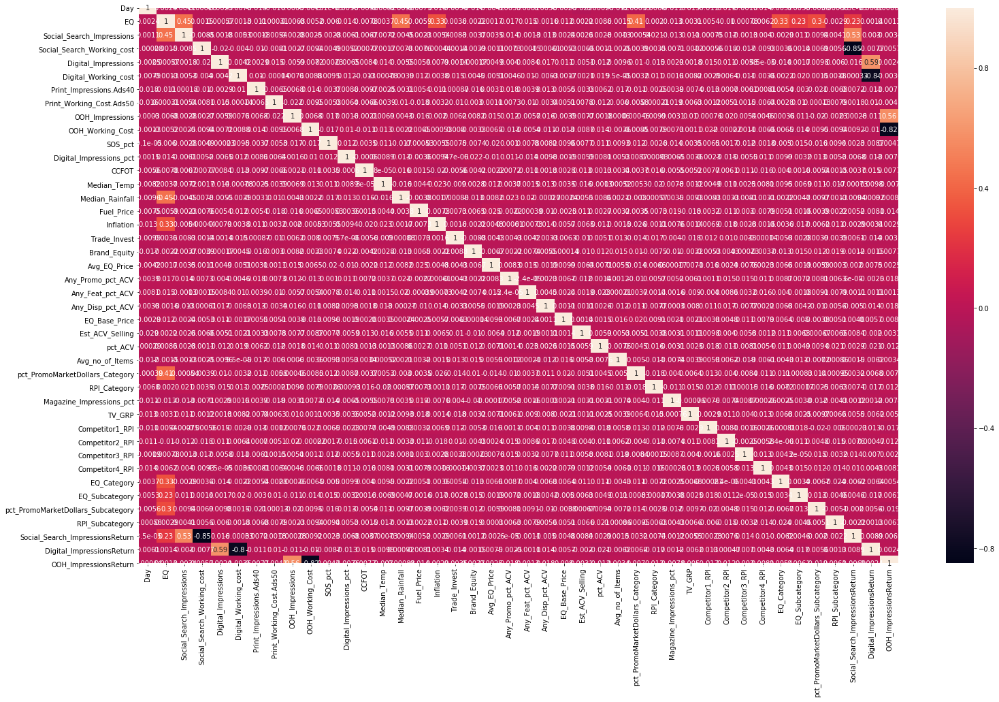

In [57]:
plt.figure(figsize=(25, 15))
sns.heatmap(convertedSales_df.corr(), annot=True)

Something is up with uncorelated data being suddenly so corelated with new property additions.

Okay lets compare the RPI's with competitor's RPI's

In [58]:
convertedSales_df[["Competitor1_RPI", "Competitor2_RPI", "Competitor3_RPI", "Competitor4_RPI"]]

,Competitor1_RPI,Competitor2_RPI,Competitor3_RPI,Competitor4_RPI
0,4.670115,3.614425,3.857778,4.288128
1,4.725528,3.791210,3.883212,4.232656
2,4.710881,3.670206,3.917210,4.300003
3,4.768479,3.698087,3.811318,4.304200
4,4.755141,3.633631,3.838592,4.341725
...,...,...,...,...
11995,4.655103,3.553918,3.832114,4.375883
11996,4.713486,3.509454,3.805551,4.376386
11997,4.708899,3.725934,3.900355,4.327042
11998,4.666736,3.782825,3.817273,4.161224


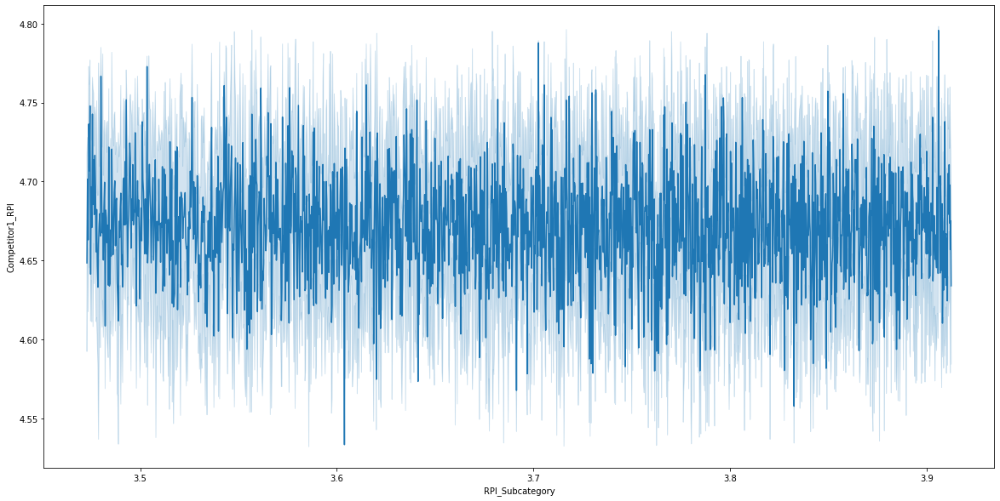

In [59]:
plt.figure(figsize=(20, 10))
sns.lineplot(x="RPI_Subcategory", y="Competitor1_RPI", data=convertedSales_df)

trying to find some grouping which would cause the data to be a little more decipherable
1. Group accoridng to EQ_Base_Price.
2. Group according to Competitor RPI's - but this would work in the wrong direction.
3. RPI_SubCategory doesn't seem to have any outright grouping.

In [60]:
len(convertedSales_df["EQ_Base_Price"].unique())

271

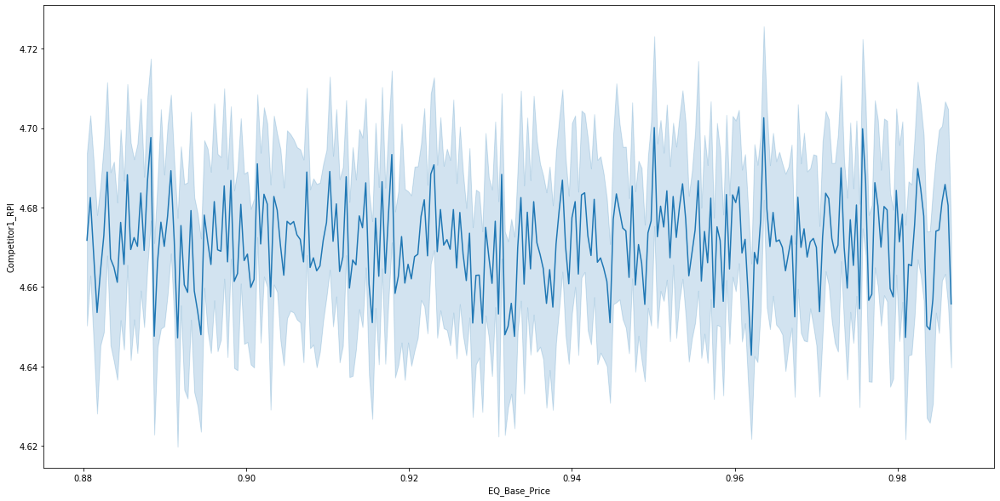

In [61]:
plt.figure(figsize=(20, 10))
sns.lineplot(x="EQ_Base_Price", y="Competitor1_RPI", data=convertedSales_df)

In [62]:
len(convertedSales_df["TV_GRP"].unique())

3236

Okay lets check how many unique values are present in all the dataset:

In [63]:
uniqueRecordCnt = [];
for val in convertedSales_df.columns:
    uniqueRecordCnt.append(len(convertedSales_df[val].unique()))

In [64]:
pd.DataFrame(list(zip(convertedSales_df.columns, uniqueRecordCnt))).sort_values(1)

,0,1
39,Social_Search_Impressions_Bin,10
40,Social_Search_WorkingCost_Bin,10
13,Median_Temp,47
41,Digital_Impressions_PCTCreated,50
10,SOS_pct,50
11,Digital_Impressions_pct,50
12,CCFOT,90
18,Brand_Equity,159
23,EQ_Base_Price,271
21,Any_Feat_pct_ACV,401


from the above only the pct fields are limited to 50, the rest are not showing any categorical data at all


In [65]:
sorted(convertedSales_df["Brand_Equity"].unique())

[3.770689829311502,
 3.7709201644501458,
 3.7711504465467307,
 3.77138067562568,
 3.7716108517114013,
 3.7718409748282835,
 3.772071045000701,
 3.7723010622530087,
 3.772531026609547,
 3.7727609380946383,
 3.772990796732589,
 3.773220602547687,
 3.773450355564206,
 3.7736800558064014,
 3.7739097032985116,
 3.77413929806476,
 3.774368840129351,
 3.774598329516474,
 3.774827766250301,
 3.775057150354989,
 3.775286481854675,
 3.775515760773483,
 3.775744987135518,
 3.77597416096487,
 3.776203282285611,
 3.7764323511217976,
 3.7766613674974696,
 3.7768903314366495,
 3.7771192429633444,
 3.7773481021015445,
 3.7775769088752233,
 3.777805663308338,
 3.778034365424829,
 3.778263015248622,
 3.7784916128036232,
 3.7787201581137255,
 3.778948651202804,
 3.779177092094717,
 3.779405480813307,
 3.7796338173824005,
 3.779862101825807,
 3.7800903341673204,
 3.780318514430718,
 3.7805466426397603,
 3.780774718818192,
 3.781002742989742,
 3.7812307151781224,
 3.7814586354070294,
 3.7816865037001426,
 

In [66]:
sorted(np.round(convertedSales_df["EQ_Base_Price"].unique(), 3))

[0.88,
 0.881,
 0.881,
 0.882,
 0.882,
 0.883,
 0.883,
 0.883,
 0.884,
 0.884,
 0.885,
 0.885,
 0.885,
 0.886,
 0.886,
 0.887,
 0.887,
 0.887,
 0.888,
 0.888,
 0.889,
 0.889,
 0.89,
 0.89,
 0.89,
 0.891,
 0.891,
 0.892,
 0.892,
 0.892,
 0.893,
 0.893,
 0.894,
 0.894,
 0.894,
 0.895,
 0.895,
 0.896,
 0.896,
 0.896,
 0.897,
 0.897,
 0.898,
 0.898,
 0.899,
 0.899,
 0.899,
 0.9,
 0.9,
 0.901,
 0.901,
 0.901,
 0.902,
 0.902,
 0.903,
 0.903,
 0.903,
 0.904,
 0.904,
 0.905,
 0.905,
 0.905,
 0.906,
 0.906,
 0.907,
 0.907,
 0.907,
 0.908,
 0.908,
 0.909,
 0.909,
 0.909,
 0.91,
 0.91,
 0.911,
 0.911,
 0.911,
 0.912,
 0.912,
 0.913,
 0.913,
 0.913,
 0.914,
 0.914,
 0.915,
 0.915,
 0.915,
 0.916,
 0.916,
 0.917,
 0.917,
 0.917,
 0.918,
 0.918,
 0.919,
 0.919,
 0.919,
 0.92,
 0.92,
 0.921,
 0.921,
 0.921,
 0.922,
 0.922,
 0.923,
 0.923,
 0.923,
 0.924,
 0.924,
 0.925,
 0.925,
 0.925,
 0.926,
 0.926,
 0.927,
 0.927,
 0.927,
 0.928,
 0.928,
 0.929,
 0.929,
 0.929,
 0.93,
 0.93,
 0.931,
 0.931,
 0.931

Okay lets try to divide the data into EQ_Base_Price related fields. 20 categories ranging from 1.40-1.42, 1.42 - 1.43, 1.43- 1.44......1.68-1.69

In [67]:
convertedSales_df["EQ_Base_Price"] = np.round(convertedSales_df["EQ_Base_Price"], 3)

In [68]:
x= list(range(141, 170, 1))
x= np.divide(x, 100)

In [69]:
print(x)
print(len(x))

[1.41 1.42 1.43 1.44 1.45 1.46 1.47 1.48 1.49 1.5  1.51 1.52 1.53 1.54
 1.55 1.56 1.57 1.58 1.59 1.6  1.61 1.62 1.63 1.64 1.65 1.66 1.67 1.68
 1.69]
29


In [70]:
convertedSales_df["EQ_Base_PriceBin"] = pd.cut(convertedSales_df["EQ_Base_Price"], bins=29)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]),
 <a list of 29 Text xticklabel objects>)

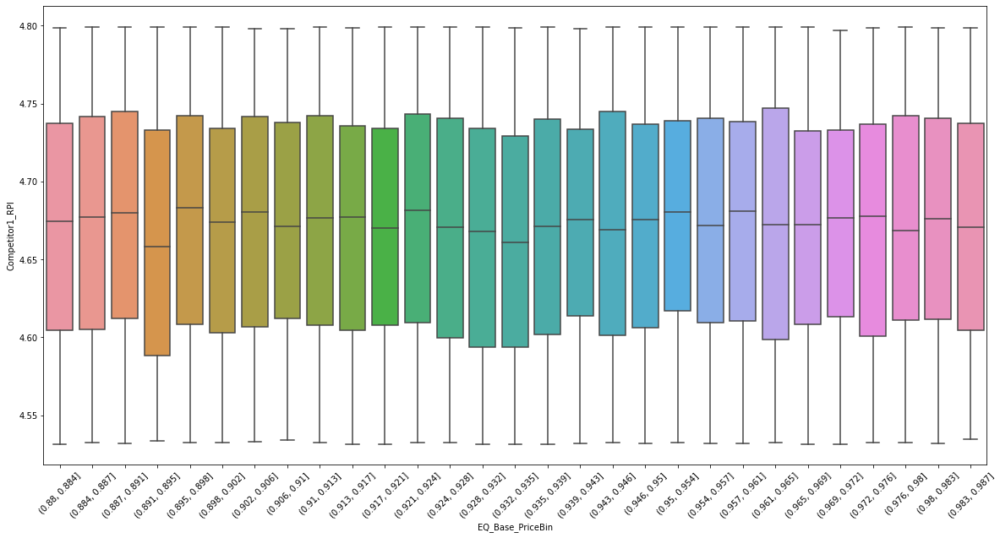

In [71]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="EQ_Base_PriceBin", y="Competitor1_RPI", data=convertedSales_df)
plt.xticks(rotation=45)

In [72]:
print(sorted(convertedSales_df["Avg_EQ_Price"].unique()))

[3.76630335107874, 3.7665346986795405, 3.7667659927710075, 3.7669972333778885, 3.7672284205249125, 3.7674595542367935, 3.767690634538226, 3.7679216614538893, 3.768152635008444, 3.7683835552265355, 3.76861442213279, 3.768845235751818, 3.769075996108213, 3.769306703226551, 3.769537357131391, 3.7697679578472747, 3.7699985053987284, 3.7702289998102594, 3.770459441106359, 3.770689829311502, 3.7709201644501458, 3.7711504465467307, 3.77138067562568, 3.7716108517114013, 3.7718409748282835, 3.772071045000701, 3.7723010622530087, 3.772531026609547, 3.7727609380946383, 3.772990796732589, 3.773220602547687, 3.773450355564206, 3.7736800558064014, 3.7739097032985116, 3.77413929806476, 3.774368840129351, 3.774598329516474, 3.774827766250301, 3.775057150354989, 3.775286481854675, 3.775515760773483, 3.775744987135518, 3.77597416096487, 3.776203282285611, 3.7764323511217976, 3.7766613674974696, 3.7768903314366495, 3.7771192429633444, 3.7773481021015445, 3.7775769088752233, 3.777805663308338, 3.778034365

In [73]:
print(sorted(convertedSales_df["Competitor1_RPI"].unique()))

[4.531523645819793, 4.531631282653221, 4.531738907902208, 4.531846521569248, 4.531954123656832, 4.532061714167453, 4.532169293103601, 4.532276860467767, 4.532384416262439, 4.5324919604901055, 4.532599493153256, 4.532707014254376, 4.532814523795951, 4.532922021780467, 4.533029508210409, 4.5331369830882595, 4.533244446416503, 4.533351898197619, 4.533459338434091, 4.533566767128399, 4.533674184283021, 4.533781589900438, 4.533888983983128, 4.533996366533566, 4.534103737554231, 4.5342110970475975, 4.53431844501614, 4.534425781462334, 4.5345331063886505, 4.534640419797564, 4.534747721691546, 4.5348550120730655, 4.534962290944595, 4.535069558308602, 4.535176814167556, 4.535284058523925, 4.535391291380175, 4.535498512738772, 4.535605722602182, 4.53571292097287, 4.535820107853298, 4.535927283245931, 4.536034447153229, 4.536141599577656, 4.536248740521669, 4.536355869987732, 4.5364629879783, 4.5365700944958345, 4.536677189542791, 4.536784273121627, 4.536891345234797, 4.5369984058847574, 4.537105

There are 60-40 = 20 categories of Avg_EQ_Price and 120-90 = 30 categories of competitor RPI.

In [74]:
sorted(convertedSales_df["EQ_Category"].unique())

[14.026517558386864,
 14.027066430702831,
 14.027793748473638,
 14.030624356933131,
 14.031038786171644,
 14.032287485270166,
 14.03255394102781,
 14.03297159432934,
 14.033294170436164,
 14.033822455616303,
 14.03423395477299,
 14.03469026361201,
 14.034849280087416,
 14.036049119236239,
 14.037003948511803,
 14.037313210675642,
 14.037555906474472,
 14.03784978589714,
 14.03797788068746,
 14.038018707453492,
 14.038290043014403,
 14.038983654972336,
 14.039036436182238,
 14.039609652601516,
 14.039706355473227,
 14.040266408824758,
 14.040817367746742,
 14.041509229540837,
 14.041772442220594,
 14.04303171357185,
 14.043093042620134,
 14.043304877669911,
 14.043779352750958,
 14.045868026296679,
 14.045937123627445,
 14.046590532391999,
 14.047170541302787,
 14.047411649832137,
 14.048530774052036,
 14.049128659140498,
 14.049882830563076,
 14.050279076748657,
 14.050789773322991,
 14.052061428154024,
 14.05236685830188,
 14.05537434382058,
 14.055821109496272,
 14.055915471077338,
 

In [75]:
convertedSales_df[["EQ_Category", "EQ_Subcategory"]].astype("str")

,EQ_Category,EQ_Subcategory
0,15.50561541396537,13.07224833597248
1,16.313303159444423,12.825414500442015
2,16.295393861850265,12.32822390437031
3,15.767905634351392,13.22011239899668
4,16.256883727976163,12.445656314490924
...,...,...
11995,15.928487088310446,13.034329659820779
11996,15.313357921656445,13.036467741380553
11997,14.270359304894596,13.242389229400112
11998,16.05527405506071,13.275474088079651


In [76]:
convertedSales_df["EQ_StartCategory"] =sales_df["EQ_Category"].astype("str").apply(lambda val: val[-len(val):-5])

In [77]:
convertedSales_df["EQ_StartCategory"] = convertedSales_df["EQ_StartCategory"].astype("int")

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110]),
 <a list of 111 Text xticklabel objects>)

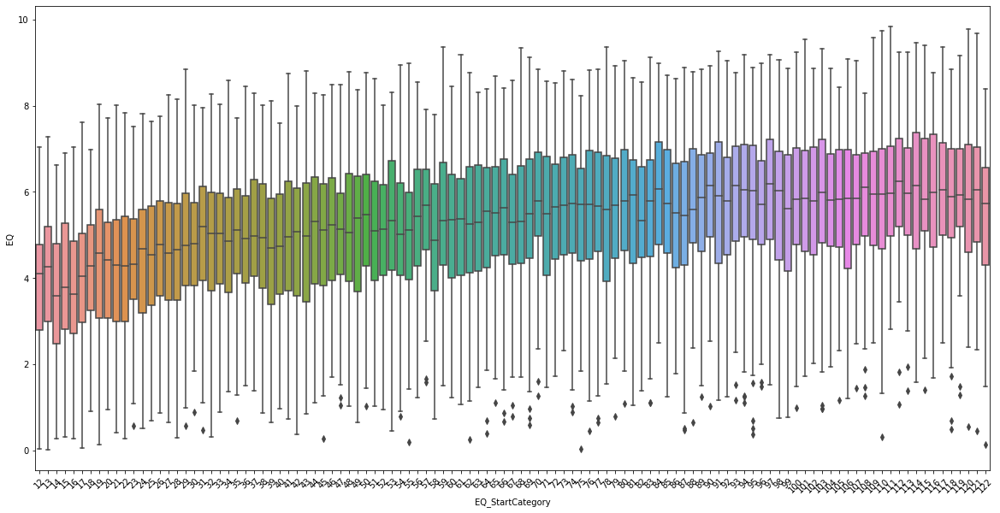

In [78]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="EQ_StartCategory", y="EQ", data=convertedSales_df)
plt.xticks(rotation=45)

<b>First correlation between the EQ Category and EQ sales. Higher the category values, Higher the EQ sales</b>

In [79]:
convertedSales_df["EQ_StartSubCategory"]= sales_df["EQ_Subcategory"].astype("str").apply(lambda val: val[-len(val):-4])

In [80]:
convertedSales_df["EQ_StartSubCategory"] = convertedSales_df["EQ_StartSubCategory"].astype("int")

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69]), <a list of 70 Text xticklabel objects>)

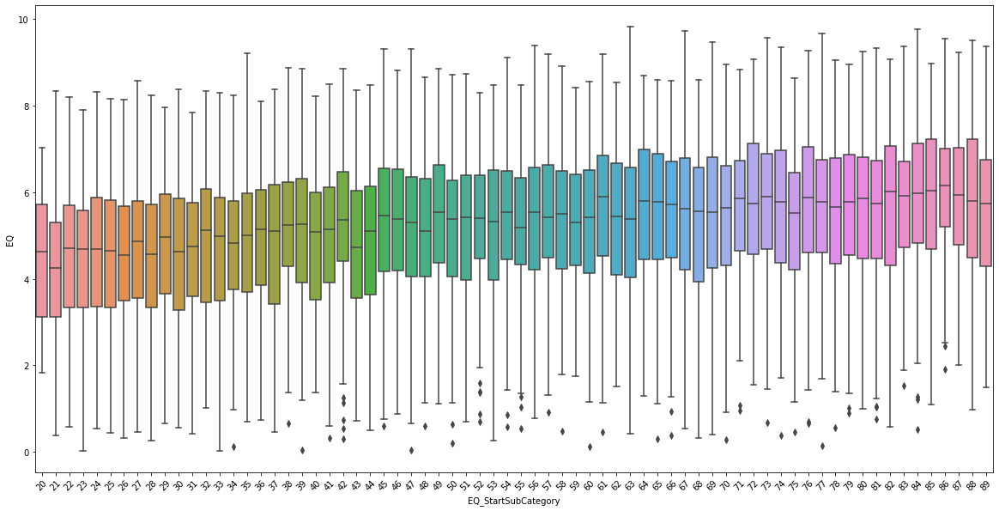

In [81]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="EQ_StartSubCategory", y="EQ", data=convertedSales_df)
plt.xticks(rotation=45)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110]),
 <a list of 111 Text xticklabel objects>)

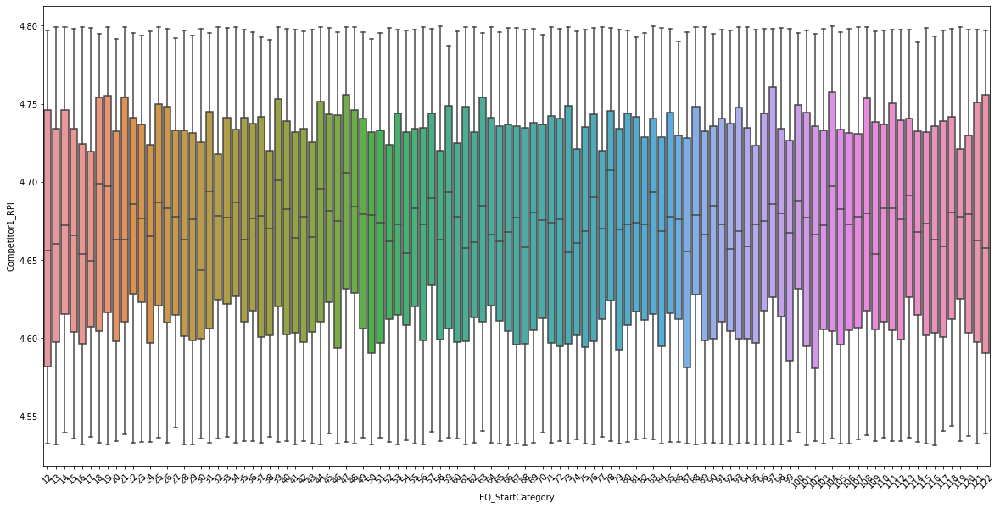

In [82]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="EQ_StartCategory", y="Competitor1_RPI", data=convertedSales_df)
plt.xticks(rotation=45)

In [83]:
convertedSales_df["pct_PromoMarketDollars_Category"] = np.round(sales_df["pct_PromoMarketDollars_Category"], 5)

In [84]:
convertedSales_df["pct_PromoMarketDollars_Subcategory"] = np.round(sales_df["pct_PromoMarketDollars_Subcategory"], 5)

In [85]:
convertedSales_df[["pct_PromoMarketDollars_Category", "pct_PromoMarketDollars_Subcategory"]] 

,pct_PromoMarketDollars_Category,pct_PromoMarketDollars_Subcategory
0,0.19960,0.3766
1,0.29390,0.2515
2,0.31483,0.3679
3,0.07673,0.0504
4,0.36388,0.2219
...,...,...
11995,0.18239,0.3466
11996,0.05693,0.2238
11997,0.36290,0.0703
11998,0.42034,0.0599


In [86]:
convertedSales_df["Print_Impressions.Ads40"]

0        11.927938
1        12.483738
2        11.921758
3        12.442957
4        12.538530
           ...    
11995    11.901414
11996    12.421192
11997    11.612282
11998    12.527119
11999    12.268507
Name: Print_Impressions.Ads40, Length: 12000, dtype: float64

In [87]:
convertedSales_df["Print_Working_Cost.Ads50"]

0         6.951772
1        11.640289
2        10.558465
3        10.891541
4        11.463515
           ...    
11995    12.078563
11996    11.630913
11997    11.881235
11998    10.945141
11999     9.821735
Name: Print_Working_Cost.Ads50, Length: 12000, dtype: float64

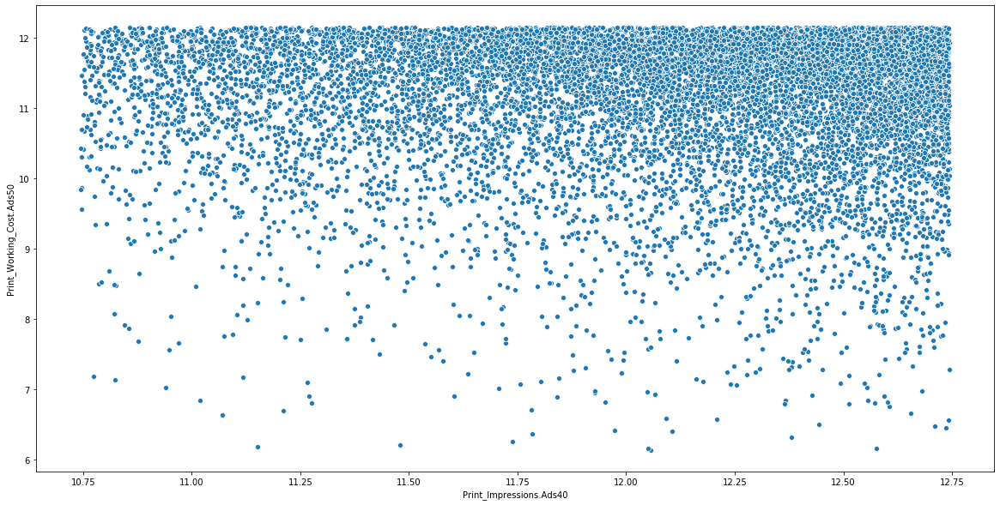

In [88]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="Print_Impressions.Ads40", y="Print_Working_Cost.Ads50", data=convertedSales_df)

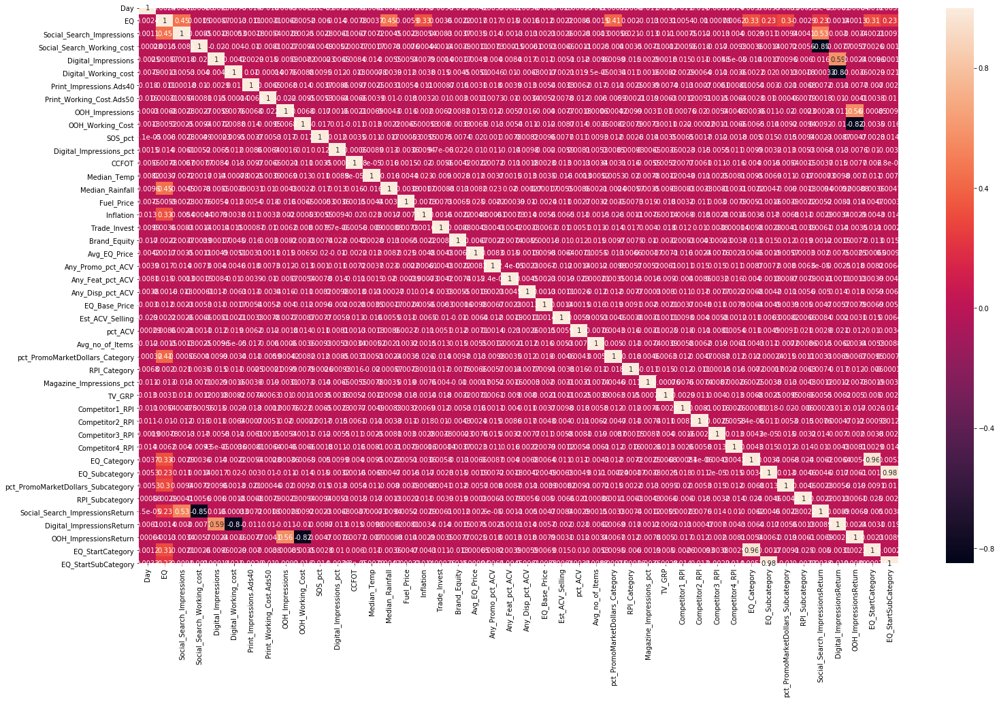

In [89]:
plt.figure(figsize=(25, 15))
sns.heatmap(convertedSales_df.corr(), annot=True)

Lets calculate CPM = total campaign Cost/(total # of impressions/1000)

In [90]:
convertedSales_df["Social_Search_Impressions_CPM"] = convertedSales_df["Social_Search_Working_cost"]/(convertedSales_df["Social_Search_Impressions"]/1000)
convertedSales_df["Digital_Impressions_CPM"] = convertedSales_df["Digital_Working_cost"]/(convertedSales_df["Digital_Impressions"]/1000)
convertedSales_df["Print_Impressions.Ads40_CPM"] = convertedSales_df["Print_Impressions.Ads40"]/(convertedSales_df["Print_Working_Cost.Ads50"]/1000)
convertedSales_df["OOH_Impressions_CPM"] = convertedSales_df["OOH_Impressions"]/(convertedSales_df["OOH_Working_Cost"]/1000)

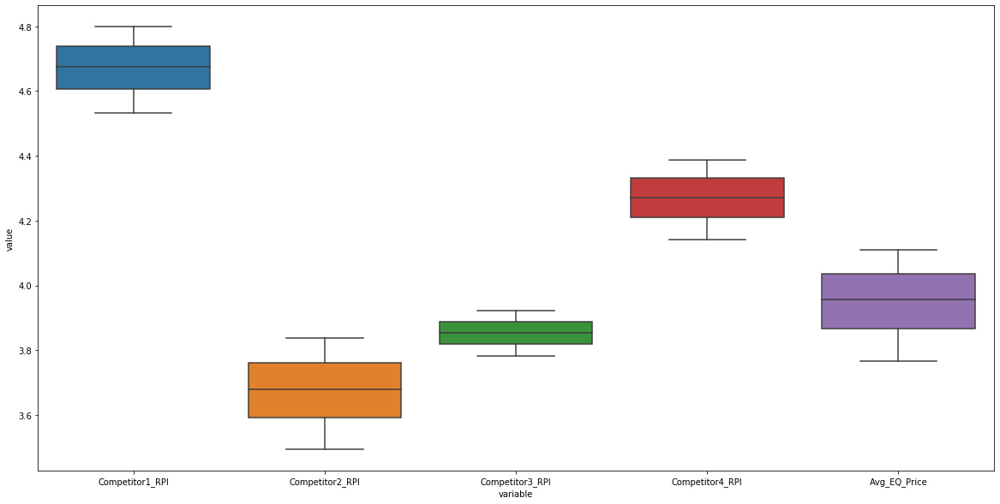

In [91]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="variable", y="value", data=pd.melt(convertedSales_df[["Competitor1_RPI", "Competitor2_RPI", "Competitor3_RPI", "Competitor4_RPI", "Avg_EQ_Price"]]))

the current company is between the 4 competitor's RPI's

Lets compare the base_price to the avg_EQ_Price, we would know if the company is raising prices on some products and which

In [92]:
np.round(convertedSales_df["EQ_Base_Price"]*10)

0        10.0
1        10.0
2        10.0
3        10.0
4         9.0
         ... 
11995     9.0
11996     9.0
11997     9.0
11998     9.0
11999     9.0
Name: EQ_Base_Price, Length: 12000, dtype: float64

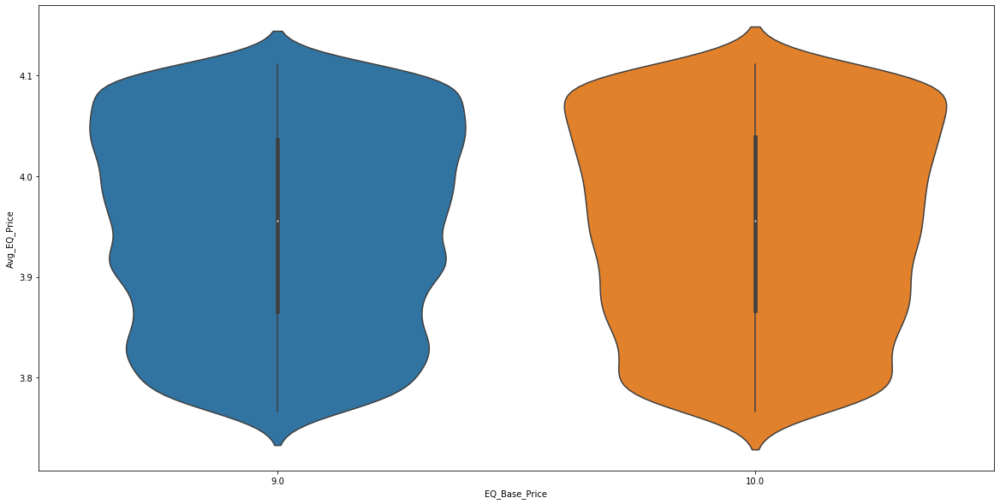

In [93]:
plt.figure(figsize=(20, 10))
sns.violinplot(np.round(convertedSales_df["EQ_Base_Price"]*10), convertedSales_df["Avg_EQ_Price"])

In [94]:
convertedSales_df["EQ_Rise"] = convertedSales_df["Avg_EQ_Price"] -convertedSales_df["EQ_Base_Price"]

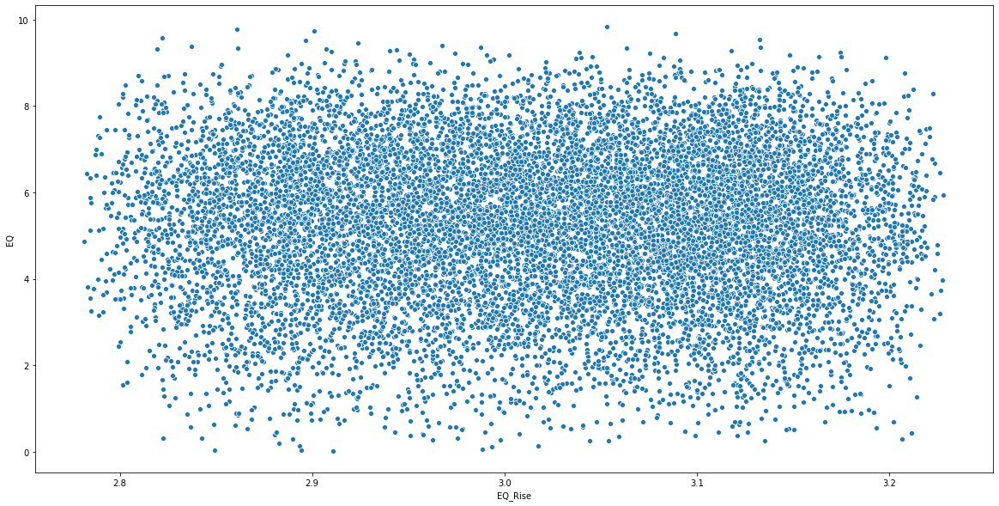

In [95]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="EQ_Rise", y="EQ",  data=convertedSales_df)

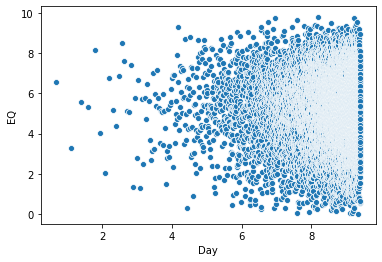

In [96]:
sns.scatterplot(x="Day", y="EQ", data=convertedSales_df)

In [97]:
sorted(convertedSales_df["EQ"].unique())

[0.01927185597180226,
 0.030260636645724384,
 0.03550400390202733,
 0.04736722969723208,
 0.12102000372896077,
 0.12872685752035198,
 0.13360668672735052,
 0.19695018877977374,
 0.2545171645081604,
 0.2598237376758283,
 0.2631579021460862,
 0.26869981243232977,
 0.27692051305694854,
 0.29136326845301774,
 0.30290775938571657,
 0.3103744197471635,
 0.3114761934950951,
 0.3152894592502082,
 0.3477508343714302,
 0.37080899734160266,
 0.3714261322315894,
 0.3722042535560335,
 0.38602427063015515,
 0.39167307584814487,
 0.41334849545972013,
 0.4189335865804015,
 0.44032088795218916,
 0.45749450587846485,
 0.45757448539945955,
 0.4583553581563089,
 0.46063815989085827,
 0.46157510469149776,
 0.48123474721407106,
 0.5047303928903426,
 0.5064629576822297,
 0.5081339348996271,
 0.5334040512558345,
 0.5390298255524091,
 0.5408017446655624,
 0.5426903747387007,
 0.5472409249283959,
 0.5632084393137493,
 0.5745516799307623,
 0.5758860603882276,
 0.5790439013565338,
 0.5795370097116042,
 0.58198165

In [98]:
convertedSales_df["EQ"].describe()

count    12000.000000
mean         5.236237
std          1.738880
min          0.019272
25%          4.070808
50%          5.355324
75%          6.501430
max          9.828687
Name: EQ, dtype: float64

In [99]:
convertedSales_df.loc[(convertedSales_df["EQ"] == np.min(convertedSales_df["EQ"])) | (convertedSales_df["EQ"] == np.max(convertedSales_df["EQ"]))]

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,Digital_ImpressionsReturn,OOH_ImpressionsReturn,EQ_Base_PriceBin,EQ_StartCategory,EQ_StartSubCategory,Social_Search_Impressions_CPM,Digital_Impressions_CPM,Print_Impressions.Ads40_CPM,OOH_Impressions_CPM,EQ_Rise
3571,8.181161,9.828687,17.366746,10.452042,13.684812,12.463904,12.152461,12.013446,20.317576,14.572836,...,1.097956,1.394209,"(0.976, 0.98]",111,63,601.842300,910.783709,1011.571592,1394.208768,3.052937
11250,9.328301,0.019272,14.687326,11.422333,16.293570,12.142755,12.707021,10.605644,18.023687,13.790044,...,1.341835,1.307007,"(0.928, 0.932]",13,23,777.699982,745.248254,1198.137578,1307.007246,2.910957


Looking at the data, there are some observations that can be made using the largest and smallest sales done.
1. Social_Search_Impressions was high in higher EQ. But WorkingCost was low.
2. Digital_Impressions has opposite effect on the EQ.
3. Print_working_costAds50 has positive corelation.
4. OOH has Positive corelation.


Lets look at median values of the above statistic's using EQ.

In [100]:
convertedSales_df.loc[(sales_df["EQ"]<=200)].describe()

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,Social_Search_ImpressionsReturn,Digital_ImpressionsReturn,OOH_ImpressionsReturn,EQ_StartCategory,EQ_StartSubCategory,Social_Search_Impressions_CPM,Digital_Impressions_CPM,Print_Impressions.Ads40_CPM,OOH_Impressions_CPM,EQ_Rise
count,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,...,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000,5876.000000
mean,8.396034,3.799058,16.256039,10.816613,15.423193,12.021642,12.063913,11.159890,19.754143,14.317553,...,1.511895,1.291300,1.382858,58.449966,50.752042,667.680640,783.018627,1090.695878,1382.857798,3.016202
std,0.995472,1.134089,0.918417,0.789557,0.970728,0.903045,0.520621,0.961322,0.673703,0.669342,...,0.150956,0.138651,0.082217,31.750062,19.645227,63.371727,81.979436,123.630361,82.216848,0.103015
min,1.098612,0.019272,13.680964,8.182839,10.109037,8.158802,10.744473,6.137727,17.810966,12.383151,...,1.174482,0.812659,1.181258,12.000000,20.000000,473.913497,507.551641,887.190023,1181.258371,2.781535
25%,8.011769,3.092604,15.675272,10.411953,15.062807,11.614152,11.707803,10.756918,19.362930,13.912804,...,1.416076,1.220606,1.330628,30.000000,33.000000,631.471472,742.735373,1018.542524,1330.627552,2.933278
50%,8.702676,4.036701,16.459683,11.045622,15.733231,12.293630,12.180791,11.453823,19.941675,14.487013,...,1.491768,1.273768,1.372822,54.000000,49.000000,670.345530,785.072230,1062.092887,1372.822298,3.021053
75%,9.105591,4.720390,17.015998,11.430790,16.117509,12.705126,12.502786,11.875798,20.302704,14.863746,...,1.583603,1.346375,1.428873,84.000000,67.000000,706.176867,819.265303,1130.936514,1428.873101,3.100674
max,9.392745,5.303276,17.460036,11.723276,16.398281,12.976970,12.743270,12.156788,20.559995,15.136708,...,2.110090,1.970243,1.656811,122.000000,89.000000,851.439312,1230.528079,1964.160703,1656.811485,3.227546


In [101]:
convertedSales_df.loc[(sales_df["EQ"]>=300)].describe()

,Day,EQ,Social_Search_Impressions,Social_Search_Working_cost,Digital_Impressions,Digital_Working_cost,Print_Impressions.Ads40,Print_Working_Cost.Ads50,OOH_Impressions,OOH_Working_Cost,...,Social_Search_ImpressionsReturn,Digital_ImpressionsReturn,OOH_ImpressionsReturn,EQ_StartCategory,EQ_StartSubCategory,Social_Search_Impressions_CPM,Digital_Impressions_CPM,Print_Impressions.Ads40_CPM,OOH_Impressions_CPM,EQ_Rise
count,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,...,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000,5042.000000
mean,8.390078,6.853525,16.880241,10.815924,15.408000,12.021998,12.050286,11.168991,19.740196,14.303309,...,1.569694,1.289964,1.383483,75.465292,58.909758,641.384851,783.786578,1088.687234,1383.483326,3.013923
std,0.991931,0.810093,0.526260,0.783960,0.967172,0.899133,0.532300,0.961046,0.680763,0.690312,...,0.134199,0.138266,0.084709,29.326577,18.992705,50.865197,81.897134,125.234797,84.709437,0.103948
min,0.693147,5.707157,14.086439,8.173857,10.062242,8.200288,10.744882,6.152733,17.812902,12.377628,...,1.230723,0.799224,1.178647,12.000000,20.000000,472.119109,503.853909,887.124749,1178.647040,2.782999
25%,7.997831,6.188314,16.623157,10.377413,14.985704,11.649037,11.685325,10.774216,19.331946,13.901237,...,1.481165,1.218401,1.329630,52.000000,44.000000,613.061878,743.549861,1016.094704,1329.630079,2.929331
50%,8.694586,6.718755,17.041262,11.040455,15.708199,12.289474,12.168760,11.474517,19.926227,14.489238,...,1.534907,1.275396,1.372144,78.000000,61.000000,651.505374,784.070115,1060.567012,1372.144399,3.020241
75%,9.104869,7.396764,17.279434,11.431222,16.114708,12.684564,12.504464,11.874158,20.298705,14.866120,...,1.631157,1.344900,1.429548,101.000000,75.000000,675.144334,820.747577,1129.346172,1429.548054,3.101732
max,9.392412,9.828687,17.460239,11.723178,16.398658,12.976655,12.743133,12.156578,20.559807,15.136785,...,2.118110,1.984702,1.652184,122.000000,89.000000,812.530297,1251.212976,2043.846345,1652.183705,3.228233


In [102]:
salesEQ_pv = pd.pivot_table(convertedSales_df, index="EQ_StartCategory", columns="EQ_StartSubCategory", values="EQ", aggfunc=np.mean)

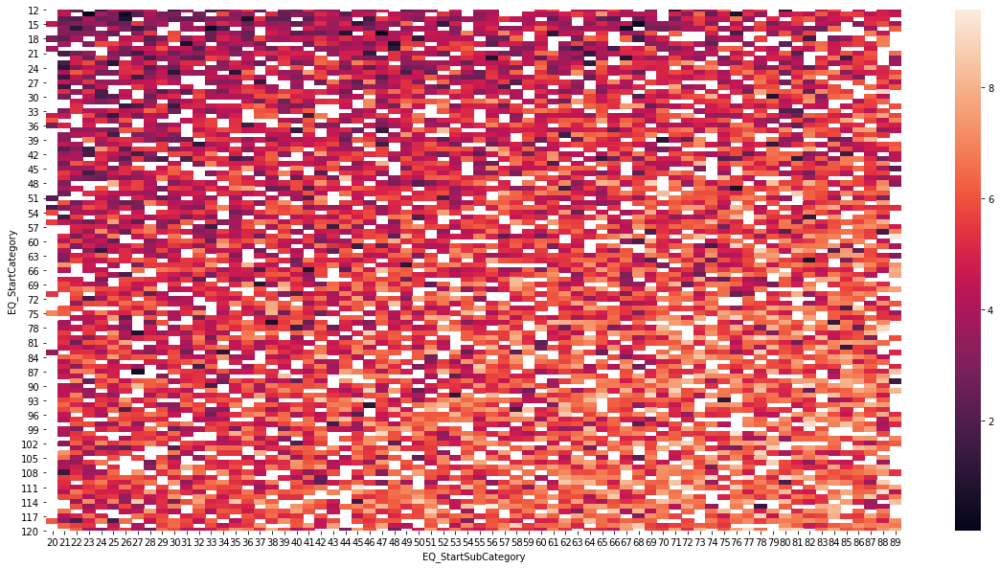

In [103]:
plt.figure(figsize=(20, 10))
sns.heatmap(salesEQ_pv)

Higher sales are present with Higher StartCategory+StartSubCategory. Depending lets test the hypothesis of creating a sum of StartCategory + StartSubCategory to view the EQ coutns.

In [104]:
convertedSales_df["EQ_CategorySum"] = convertedSales_df["EQ_StartCategory"] + convertedSales_df["EQ_StartSubCategory"]

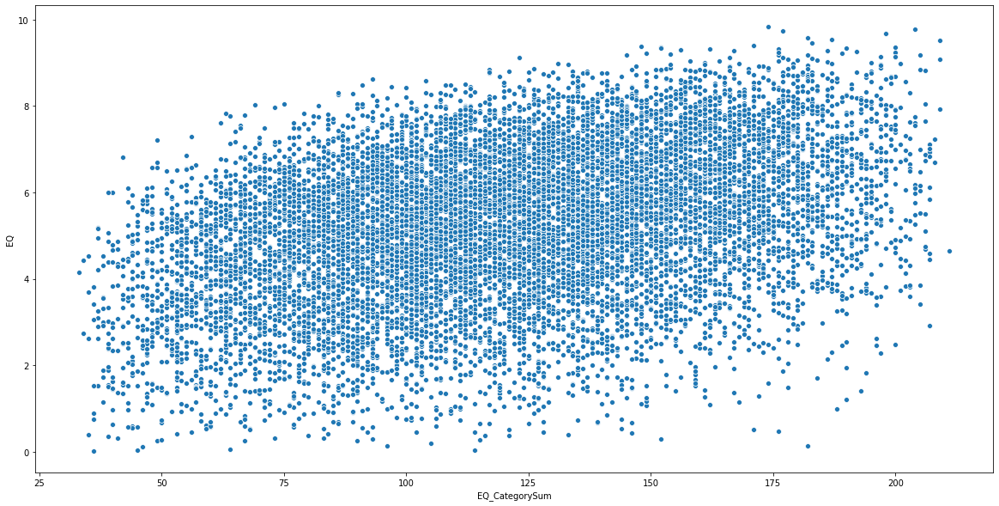

In [105]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="EQ_CategorySum", y="EQ", data=convertedSales_df)

#### This clearly shows linear relationship between EQ_categorySum and EQ.

In [106]:
convertedSales_df["Inflation"] = np.round(convertedSales_df["Inflation"], 6)

In [107]:
convertedSales_df["Inflation"].describe()

count    12000.000000
mean         0.066606
std          0.032266
min          0.009882
25%          0.038620
50%          0.067253
75%          0.094705
max          0.121470
Name: Inflation, dtype: float64

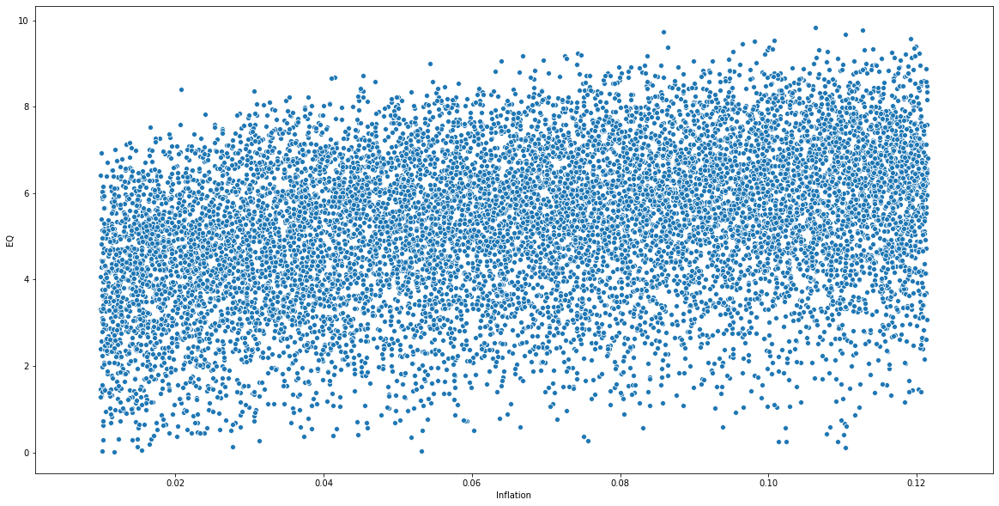

In [108]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="Inflation", y="EQ", data=convertedSales_df)

Does inflation have any affect on the workingCost.

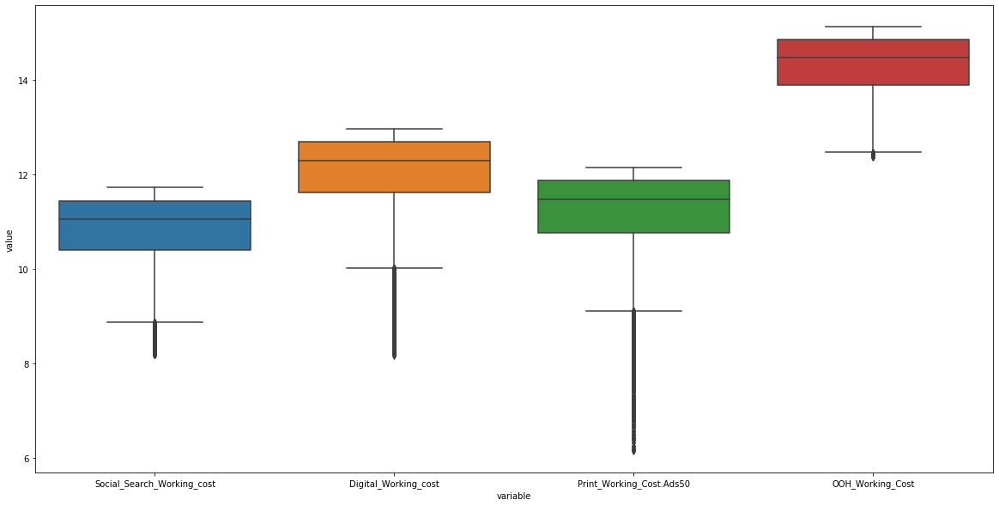

In [109]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="variable", y="value", data=pd.melt(convertedSales_df[["Social_Search_Working_cost", "Digital_Working_cost", "Print_Working_Cost.Ads50", "OOH_Working_Cost"]]))

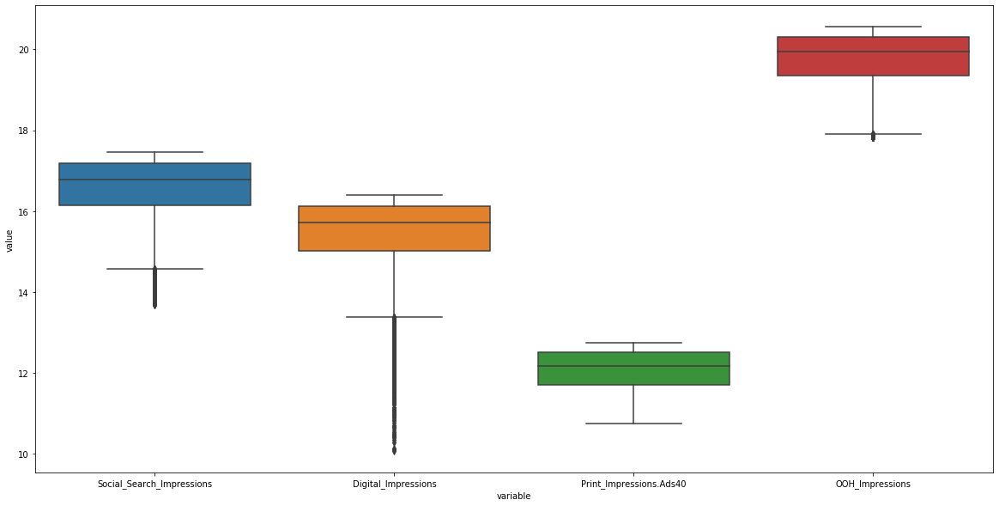

In [110]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="variable", y="value", data=pd.melt(convertedSales_df[["Social_Search_Impressions", "Digital_Impressions", "Print_Impressions.Ads40", "OOH_Impressions"]]))

The amount of SocialSearch cost and social Search Impressions are 

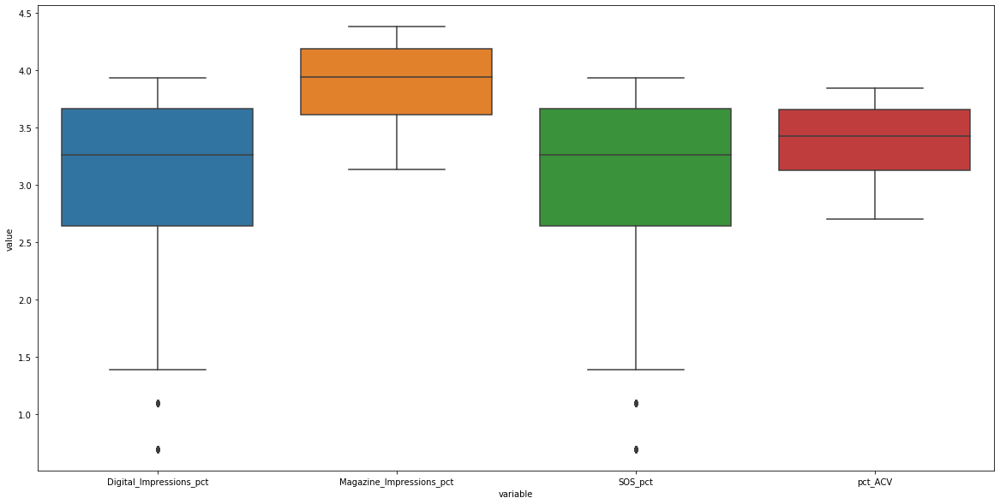

In [111]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="variable", y="value", data=pd.melt(convertedSales_df[["Digital_Impressions_pct", "Magazine_Impressions_pct", "SOS_pct", "pct_ACV"]]))

In [112]:
sorted(convertedSales_df["Brand_Equity"].unique())

[3.770689829311502,
 3.7709201644501458,
 3.7711504465467307,
 3.77138067562568,
 3.7716108517114013,
 3.7718409748282835,
 3.772071045000701,
 3.7723010622530087,
 3.772531026609547,
 3.7727609380946383,
 3.772990796732589,
 3.773220602547687,
 3.773450355564206,
 3.7736800558064014,
 3.7739097032985116,
 3.77413929806476,
 3.774368840129351,
 3.774598329516474,
 3.774827766250301,
 3.775057150354989,
 3.775286481854675,
 3.775515760773483,
 3.775744987135518,
 3.77597416096487,
 3.776203282285611,
 3.7764323511217976,
 3.7766613674974696,
 3.7768903314366495,
 3.7771192429633444,
 3.7773481021015445,
 3.7775769088752233,
 3.777805663308338,
 3.778034365424829,
 3.778263015248622,
 3.7784916128036232,
 3.7787201581137255,
 3.778948651202804,
 3.779177092094717,
 3.779405480813307,
 3.7796338173824005,
 3.779862101825807,
 3.7800903341673204,
 3.780318514430718,
 3.7805466426397603,
 3.780774718818192,
 3.781002742989742,
 3.7812307151781224,
 3.7814586354070294,
 3.7816865037001426,
 

In [113]:
convertedSales_df["EQ"].describe()

count    12000.000000
mean         5.236237
std          1.738880
min          0.019272
25%          4.070808
50%          5.355324
75%          6.501430
max          9.828687
Name: EQ, dtype: float64

In [114]:
EQRange = range(0, 10, 1)
EQRange = list(EQRange)+ [np.inf]

In [115]:
print(EQRange)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, inf]


In [116]:
convertedSales_df["EQBins"] = pd.cut(convertedSales_df["EQ"], bins=EQRange)

In [117]:
convertedSales_df["EQBins"]

0        (6.0, 7.0]
1        (3.0, 4.0]
2        (5.0, 6.0]
3        (5.0, 6.0]
4        (8.0, 9.0]
            ...    
11995    (7.0, 8.0]
11996    (5.0, 6.0]
11997    (5.0, 6.0]
11998    (5.0, 6.0]
11999    (4.0, 5.0]
Name: EQBins, Length: 12000, dtype: category
Categories (10, interval[float64]): [(0.0, 1.0] < (1.0, 2.0] < (2.0, 3.0] < (3.0, 4.0] ... (6.0, 7.0] < (7.0, 8.0] < (8.0, 9.0] < (9.0, inf]]

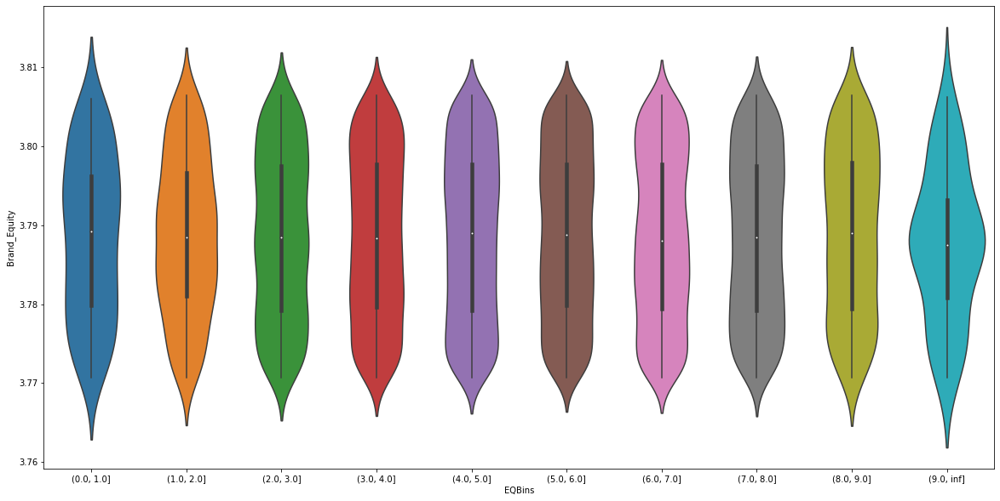

In [118]:
plt.figure(figsize=(20, 10))
sns.violinplot(x="EQBins", y="Brand_Equity", data=convertedSales_df)

In [119]:
convertedSales_df["Brand_Equity"].unique()

array([3.77894865, 3.78054664, 3.78305262, 3.79616312, 3.80287756,
       3.80644024, 3.78804583, 3.79346467, 3.77528648, 3.79458991,
       3.7999735 , 3.77826302, 3.78759293, 3.79548919, 3.80421505,
       3.78849852, 3.77230106, 3.77505715, 3.77940548, 3.80376942,
       3.79053311, 3.79638766, 3.77184097, 3.79166165, 3.80399226,
       3.77597416, 3.78532535, 3.77803437, 3.80555076, 3.78282507,
       3.79661215, 3.80265447, 3.80131488, 3.78031851, 3.78464408,
       3.78214208, 3.77207105, 3.77689033, 3.80354653, 3.80243133,
       3.78259746, 3.80086796, 3.78418963, 3.7739097 , 3.80019719,
       3.77780566, 3.77643235, 3.79503965, 3.77620328, 3.79211271,
       3.79368982, 3.7878194 , 3.77917709, 3.79075892, 3.77345036,
       3.77253103, 3.80176161, 3.78555234, 3.79795805, 3.7968366 ,
       3.79233816, 3.7816865 , 3.78962936, 3.78872479, 3.80332359,
       3.79301422, 3.79526444, 3.79974976, 3.7882722 , 3.79930214,
       3.80621795, 3.78645978, 3.80466049, 3.7823698 , 3.79098

In [120]:
#filteredSales_df["Brand_EquityCategory"] = filteredSales_df["Brand_Equity"].apply(lambda val: str((val - np.floor(val))*10)[0]).astype("int")

convertedSales_df["Brand_EquityCategory"] = convertedSales_df["Brand_Equity"].apply(lambda val: str((val - np.floor(val))*100))

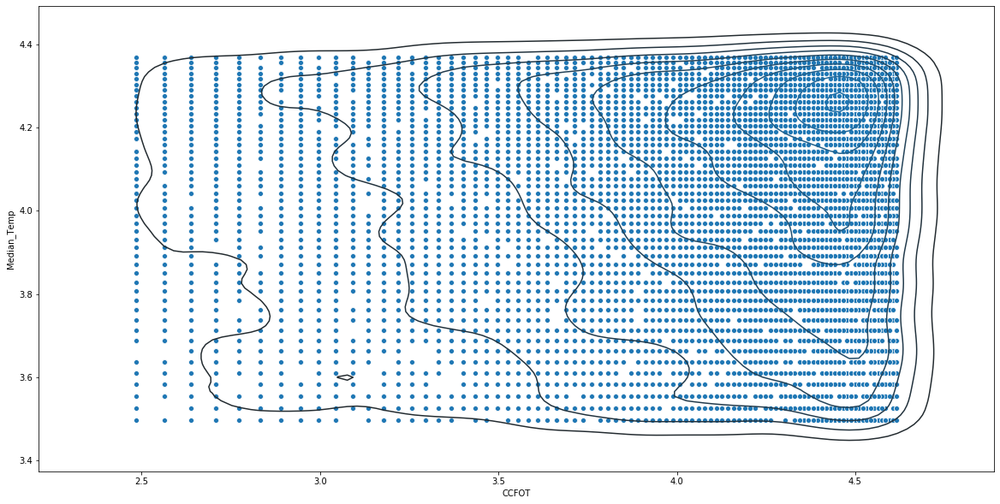

In [121]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x="CCFOT", y="Median_Temp", data=convertedSales_df)
sns.kdeplot(convertedSales_df["CCFOT"], convertedSales_df["Median_Temp"])

From the above we are able to notice that Higher the Median Temp, Higher the Customer quantity filled on time.

Lets try to group data based on monthly sales

In [170]:
convertedSales_df["Day"]= sales_df["Day"].copy()

In [171]:
convertedSales_df["Day"]

0            1
1            2
2            3
3            4
4            5
         ...  
11995    11996
11996    11997
11997    11998
11998    11999
11999    12000
Name: Day, Length: 12000, dtype: int64

In [173]:
convertedSales_df["Month"] = (convertedSales_df["Day"]//30 + 1)

In [179]:
convertedSales_df["DayOfMonth"] = convertedSales_df["Day"] - ((convertedSales_df["Month"]-1)*30)

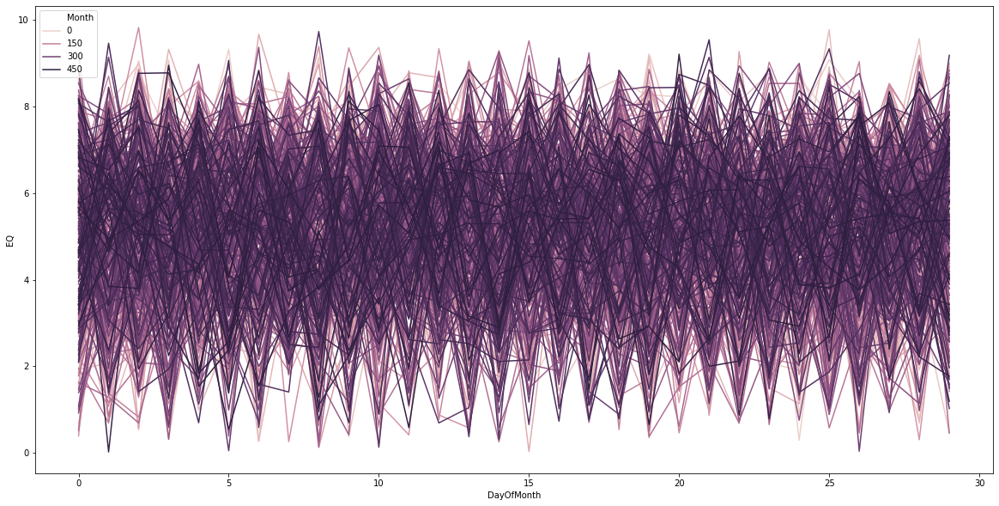

In [199]:
plt.figure(figsize=(20, 10))
sns.lineplot(x="DayOfMonth", y="EQ", hue="Month", data=convertedSales_df)


There is seasonality in the data. 
There are peaks in everydays of the months.
lets check if this happens alternatively for months

Lets see quaterly if the plots are changing.

In [206]:
#convertedSales_df["Quarter1"]
convertedSales_df["Quarter"] = convertedSales_df["Month"] - (((convertedSales_df["Month"]-1)//4)*4)


In [207]:
convertedSales_df["Quarter"]

0        1
1        1
2        1
3        1
4        1
        ..
11995    4
11996    4
11997    4
11998    4
11999    1
Name: Quarter, Length: 12000, dtype: int64

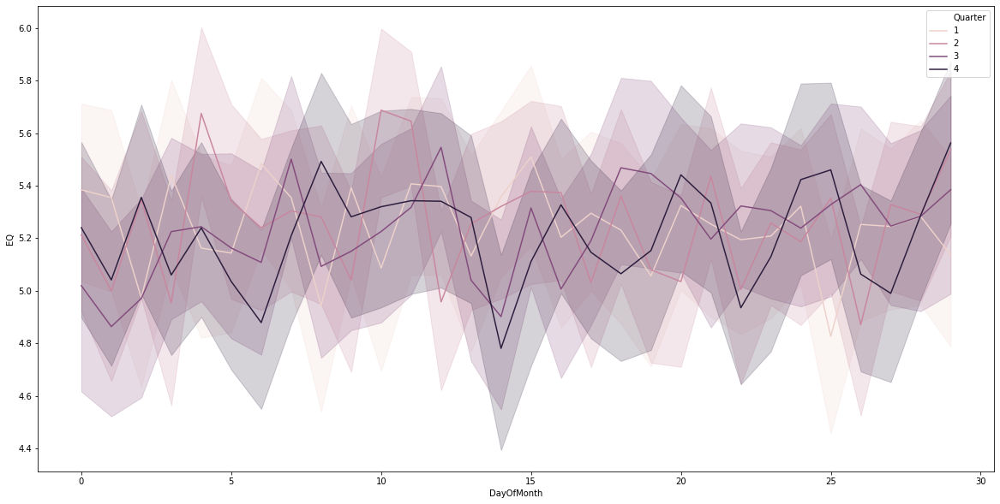

In [208]:
plt.figure(figsize=(20, 10))
sns.lineplot(x="DayOfMonth", y="EQ", hue="Quarter", data=convertedSales_df)


January, February, and March (Q1)
April, May, and June (Q2)
July, August, and September (Q3)
October, November, and December (Q4)

All the quarter's are following almost the same trends, lets try to smooth the curves to view this more concretly.


In [216]:
sns.set_style('darkgrid')
sns.set_palette("husl")

Below exponential_smoothing plots are created using below article
https://towardsdatascience.com/the-complete-guide-to-time-series-analysis-and-forecasting-70d476bfe775

In [303]:
def exponential_smoothing(series, alpha):

    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result
  
def plot_exponential_smoothing(seriesList, alphas):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    #plt.figure(figsize=(10, 5))
    for alpha in alphas:
        axes[0, 0].plot(exponential_smoothing(seriesList[0], alpha), label="Alpha {}".format(alpha))
        axes[0, 0].set_title('Quarter 1')
        axes[0, 1].plot(exponential_smoothing(seriesList[1], alpha), label="Alpha {}".format(alpha))
        axes[0, 1].set_title('Quarter 2')
        axes[1, 0].plot(exponential_smoothing(seriesList[2], alpha), label="Alpha {}".format(alpha))
        axes[1, 0].set_title('Quarter 3')
        axes[1, 1].plot(exponential_smoothing(seriesList[3], alpha), label="Alpha {}".format(alpha))
        axes[1, 1].set_title('Quarter 4')
    #plt.plot(series, "c", label = "Actual")
    #plt.legend(loc="best")
    #plt.axis('tight')
    
    #plt.grid(True);

In [304]:
quarterSales_List = [];
quarterSales_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==1, "EQ"].tolist())
quarterSales_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==2, "EQ"].tolist())
quarterSales_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==3, "EQ"].tolist())
quarterSales_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==4, "EQ"].tolist())

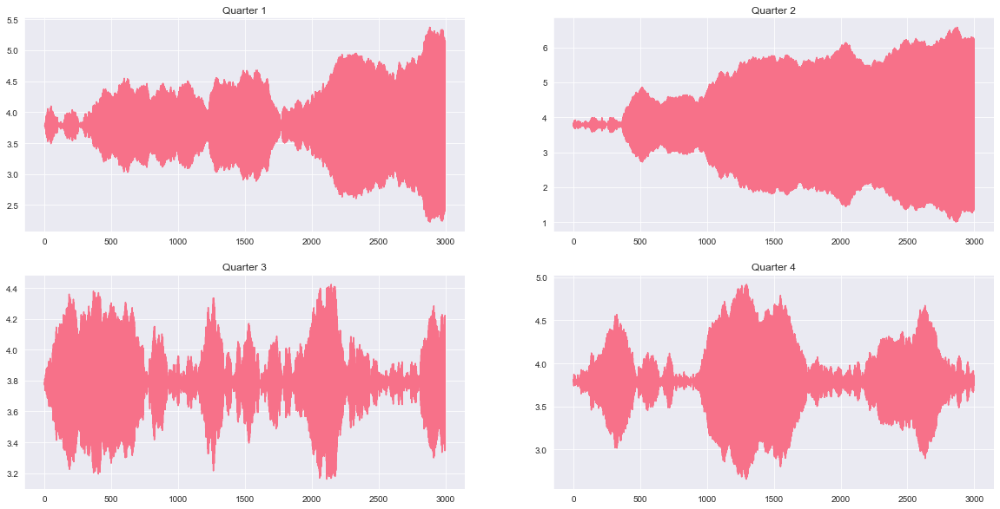

In [360]:
plot_exponential_smoothing(quarterSales_List, [2])

Above we see that data has constant mean and constant variance, no there seem to be a little of seasonality.
We may have to use ARCH model, but lets see


In [362]:
convertedSales_df["Year"] = (convertedSales_df["Day"]//365 + 1)

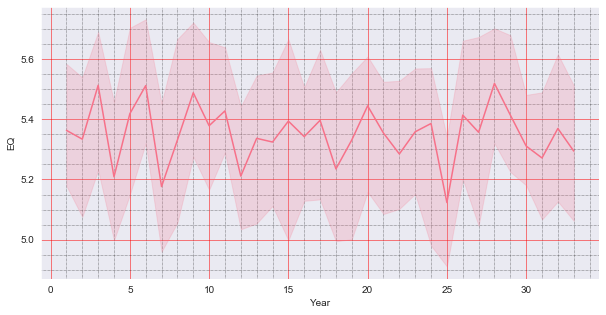

In [370]:
fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x="Year", y="EQ", data=convertedSales_df, estimator=np.median, ax=ax)
# Don't allow the axis to be on top of your data
ax.set_axisbelow(True)

# Turn on the minor TICKS, which are required for the minor GRID
ax.minorticks_on()
# Customize the major grid
ax.grid(which='major', linestyle='-', linewidth='0.5', color='red')
# Customize the minor grid
ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')

Here we notice that there are cycles in the EQ sales with years 5-7 years showing M patterns.
There is seasonality, AR and MA, But no integral - Have to check if SARIMA can be used.

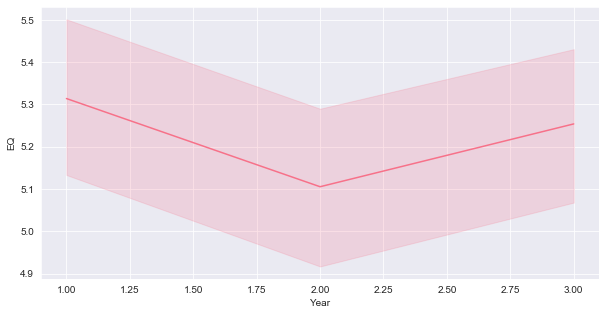

In [372]:
plt.figure(figsize=(10, 5))
sns.lineplot(x="Year", y="EQ", data=convertedSales_df.loc[convertedSales_df["Year"]//4==0])

In [307]:
quarterBrand_List = [];
quarterBrand_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==1, "Brand_Equity"].tolist())
quarterBrand_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==2, "Brand_Equity"].tolist())
quarterBrand_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==3, "Brand_Equity"].tolist())
quarterBrand_List.append(convertedSales_df.loc[convertedSales_df["Quarter"]==4, "Brand_Equity"].tolist())

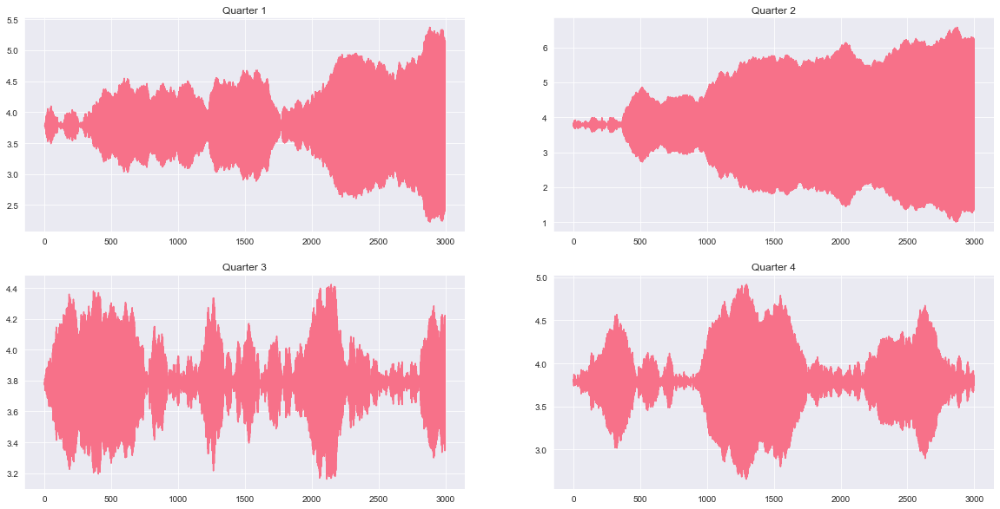

In [316]:
plot_exponential_smoothing(quarterBrand_List, [2])

In [356]:
import statsmodels.api as sm
import statsmodels.tsa.api as smt

In [333]:
def tsplot(y, lags=None, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

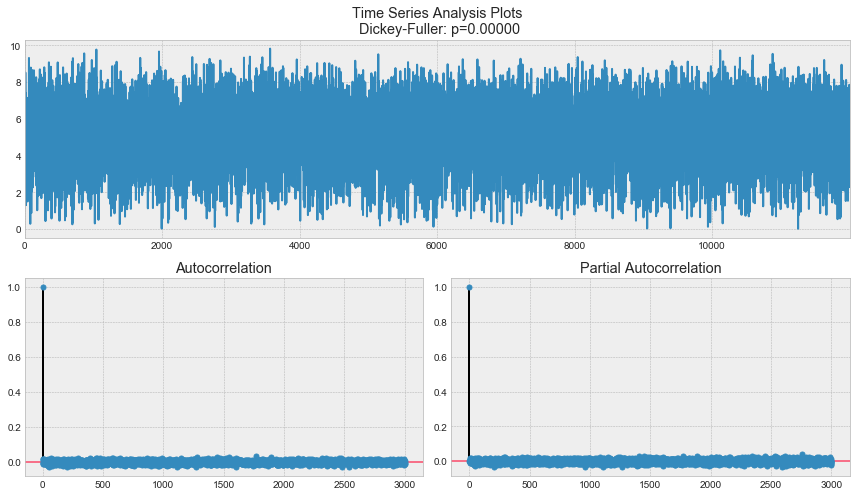

In [355]:
tsplot(convertedSales_df["EQ"].tolist(), lags=3000)
#tsplot(convertedSales_df.loc[convertedSales_df["Quarter"]==1, "EQ"].tolist(), lags=30)
#tsplot(convertedSales_df.loc[convertedSales_df["Quarter"]==1, "EQ"].tolist(), lags=30)
#tsplot(convertedSales_df.loc[convertedSales_df["Quarter"]==1, "EQ"].tolist(), lags=30)


Lets use SARIMA

In [345]:
from itertools import product
from tqdm import tqdm_notebook

In [346]:
#Set initial values and some bounds
ps = range(0, 5)
d = 1
qs = range(0, 5)
Ps = range(0, 5)
D = 1
Qs = range(0, 5)
s = 5

#Create a list with all possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

625

In [347]:
def optimize_SARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order
        D - seasonal integration order
        s - length of season
    """
    
    results = []
    best_aic = float('inf')
    
    for param in tqdm_notebook(parameters_list):
        try: model = sm.tsa.statespace.SARIMAX(convertedSales_df["EQ"], order=(param[0], d, param[1]),
                                               seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
            
        aic = model.aic
        
        #Save best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])
        
    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    #Sort in ascending order, lower AIC is better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

result_table = optimize_SARIMA(parameters_list, d, D, s)

C:\Mita\anaconda\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:993: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_re

C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mi

C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mi

C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mita\anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Mi

In [348]:
import pickle

In [349]:
with open('mypickle.pickle', 'wb') as f:
    pickle.dump(result_table, f)

In [350]:
#Set parameters that give the lowest AIC (Akaike Information Criteria)

p, q, P, Q = result_table.parameters[0]

best_model = sm.tsa.statespace.SARIMAX(convertedSales_df["EQ"], order=(p, d, q),
                                       seasonal_order=(P, D, Q, s)).fit(disp=-1)

print(best_model.summary())

                                 Statespace Model Results                                
Dep. Variable:                                EQ   No. Observations:                12000
Model:             SARIMAX(2, 1, 3)x(0, 1, 1, 5)   Log Likelihood              -23682.401
Date:                           Tue, 31 Mar 2020   AIC                          47378.801
Time:                                   10:20:41   BIC                          47430.547
Sample:                                        0   HQIC                         47396.160
                                         - 12000                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.9443      0.010   -191.226      0.000      -1.964      -1.924
ar.L2         -0.9840      0.010    -98.294

In [353]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [354]:
def plot_SARIMA(series, model, n_steps):
    """
        Plot model vs predicted values
        
        series - dataset with time series
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
    """
    
    data = series.copy().rename(columns = {'EQ': 'actual'})
    data['arima_model'] = model.fittedvalues
    #Make a shift on s+d steps, because these values were unobserved by the model due to the differentiating
    data['arima_model'][:s+d] = np.NaN
    
    #Forecast on n_steps forward
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps)
    forecast = data.arima_model.append(forecast)
    #Calculate error
    error = mean_absolute_percentage_error(data['actual'][s+d:], data['arima_model'][s+d:])
    
    plt.figure(figsize=(17, 8))
    plt.title('Mean Absolute Percentage Error: {0:.2f}%'.format(error))
    plt.plot(forecast, color='r', label='model')
    plt.axvspan(data.index[-1], forecast.index[-1],alpha=0.5, color='lightgrey')
    plt.plot(data, label='actual')
    plt.legend()
    plt.grid(True);
    
# plot_SARIMA(data, best_model, 5)
print(best_model.predict(start=convertedSales_df["EQ"].shape[0], end=convertedSales_df["EQ"].shape[0] + 5))
print(mean_absolute_percentage_error(convertedSales_df["EQ"][s+d:], best_model.fittedvalues[s+d:]))

12000    5.315705
12001    5.205190
12002    5.228040
12003    5.169005
12004    5.335242
12005    5.254908
dtype: float64
49.18297319999566


## Split train and test data

In [263]:
from sklearn.model_selection import train_test_split

In [264]:
X_train, X_test, y_train, y_test = train_test_split(convertedSales_df[convertedSales_df.columns[convertedSales_df.columns!= "EQ"]], convertedSales_df["EQ"], test_size=0.33, random_state=42)

## Model creation

In [265]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [266]:
scaler = MinMaxScaler()
scaledSales_df = scaler.fit_transform(X_train[X_train.select_dtypes(np.number).columns])
scaledSales_df

array([[0.83572262, 0.80078274, 0.85481734, ..., 0.835     , 0.31034483,
        0.66666667],
       [0.47307885, 0.66766496, 0.52967299, ..., 0.4725    , 0.27586207,
        0.33333333],
       [0.80188365, 0.75164714, 0.82117123, ..., 0.8       , 0.79310345,
        0.        ],
       ...,
       [0.44915819, 0.80752109, 0.89155804, ..., 0.4475    , 0.72413793,
        1.        ],
       [0.07159527, 0.98504877, 0.94389973, ..., 0.07      , 0.72413793,
        0.        ],
       [0.60585098, 0.93878403, 0.9184674 , ..., 0.605     , 0.37931034,
        0.66666667]])

In [267]:
scaledTestSales_df = scaler.transform(X_test[X_test.select_dtypes(np.number).columns])

In [268]:
# grid search CV

# set up cross validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
params = {'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]}

# grid search
# lasso model
model = Lasso()
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(scaledSales_df, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.3s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [269]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.024873,0.017942,0.000199,0.000399,0.001,{'alpha': 0.001},0.979401,0.979552,0.981239,0.980163,...,0.980218,0.000696,1,0.980561,0.980513,0.980111,0.980352,0.980227,0.980353,0.000169
1,0.017905,0.004566,0.000199,0.000399,0.01,{'alpha': 0.01},0.972175,0.972445,0.973843,0.971703,...,0.972723,0.000800,2,0.972936,0.972873,0.972496,0.973049,0.972561,0.972783,0.000216
2,0.010971,0.001669,0.000998,0.000631,1,{'alpha': 1.0},-0.001166,-0.001660,-0.000084,-0.001779,...,-0.001344,0.000690,3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.007652,0.006994,0.000000,0.000000,5,{'alpha': 5.0},-0.001166,-0.001660,-0.000084,-0.001779,...,-0.001344,0.000690,3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.012497,0.006248,0.000000,0.000000,10,{'alpha': 10.0},-0.001166,-0.001660,-0.000084,-0.001779,...,-0.001344,0.000690,3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


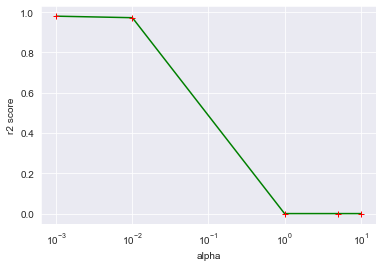

In [272]:
# plot
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'], "g-")
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'], 'r+')
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.xscale('log')
plt.show()

In [273]:
from sklearn.metrics import r2_score

In [279]:
# model with optimal alpha
# lasso regression
lm = Lasso(alpha=0.001)
lm.fit(scaledSales_df, y_train)

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [280]:
lrPredictions = lm.predict(scaledTestSales_df)
lrTrainPredictions = lm.predict(scaledSales_df)

In [281]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [282]:
print("Train - MeanSquaredError - ", np.sqrt(mean_squared_error(y_train, lrTrainPredictions)))
print("Test - MeanSquaredError - ", np.sqrt(mean_squared_error(y_test, lrPredictions)))


print("Train - R2Score - ", r2_score(y_train, lrTrainPredictions))
print("Test - R2Score - ", r2_score(y_test, lrPredictions))

Train - MeanSquaredError -  0.24439282751132663
Test - MeanSquaredError -  0.24416900346861292
Train - R2Score -  0.9803267093192357
Test - R2Score -  0.9801138810970969


In [283]:

model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train.columns
cols = cols.insert(0, "constant")
sorted(list(zip(cols, model_parameters)), key=(lambda x: x[1]))

[('constant', -0.746),
 ('Avg_no_of_Items', -0.009),
 ('Any_Promo_pct_ACV', -0.003),
 ('Brand_Equity', -0.002),
 ('Day', -0.0),
 ('Social_Search_Working_cost', -0.0),
 ('Digital_Impressions', -0.0),
 ('Digital_Working_cost', -0.0),
 ('Print_Impressions.Ads40', -0.0),
 ('Print_Working_Cost.Ads50', -0.0),
 ('OOH_Impressions', -0.0),
 ('OOH_Working_Cost', -0.0),
 ('SOS_pct', 0.0),
 ('Digital_Impressions_pct', -0.0),
 ('CCFOT', -0.0),
 ('Fuel_Price', 0.0),
 ('Trade_Invest', -0.0),
 ('Avg_EQ_Price', 0.0),
 ('Any_Feat_pct_ACV', -0.0),
 ('Any_Disp_pct_ACV', -0.0),
 ('EQ_Base_Price', -0.0),
 ('Est_ACV_Selling', -0.0),
 ('pct_ACV', -0.0),
 ('Magazine_Impressions_pct', 0.0),
 ('TV_GRP', -0.0),
 ('Competitor1_RPI', -0.0),
 ('Competitor2_RPI', 0.0),
 ('Competitor3_RPI', -0.0),
 ('Competitor4_RPI', -0.0),
 ('RPI_Subcategory', 0.0),
 ('Social_Search_Impressions_Bin', 0.0),
 ('Social_Search_WorkingCost_Bin', 0.0),
 ('Digital_Impressions_PCTCreated', -0.0),
 ('OOH_ImpressionsReturn', -0.0),
 ('EQ_Base

from the above we are able to predict the sales by the below predictors:
1. Social_Search_Impressions - How many times was the customer social searched.
2. Median Rainfall
3. pct_PromoMarketDollars_Category and pct_PromoMarketDollars_Subcategory
3. EQ_category and EQ_Subcategory
4. Higher the Inflation better the sales.
5. The higher prices Competitor and the lowest priced competitor has influence over the sales.
6. Digital_Impressions_CPM

### MultinomialNB
As Naive Bayes is able to predict classes, will be applying MultinomialNB on EQ Bins

In [154]:
from sklearn.preprocessing import LabelEncoder

In [155]:
label_encoder = LabelEncoder()

convertedSales_df["EQBinsNum"] = label_encoder.fit_transform(convertedSales_df["EQBins"])

In [162]:
X_train, X_test, y_train, y_test = train_test_split(convertedSales_df[convertedSales_df.columns[(convertedSales_df.columns!= "EQBinsNum") | (convertedSales_df.columns!= "EQ")]], convertedSales_df["EQBinsNum"], test_size=0.33, random_state=42)

In [163]:
scaler1 = MinMaxScaler()
scaledSalesMNB_df = scaler1.fit_transform(X_train[X_train.select_dtypes(np.number).columns])
scaledSalesMNB_df

array([[0.97836912, 0.66840848, 0.80078274, ..., 0.80299129, 0.47191011,
        0.66666667],
       [0.90978987, 0.06243757, 0.66766496, ..., 0.7625693 , 0.03932584,
        0.        ],
       [0.97338721, 0.36830481, 0.75164714, ..., 0.28820212, 0.37078652,
        0.33333333],
       ...,
       [0.9035374 , 0.64617903, 0.80752109, ..., 0.59582576, 0.64606742,
        0.66666667],
       [0.68248761, 0.73427723, 0.98504877, ..., 0.85629925, 0.53932584,
        0.77777778],
       [0.93960085, 0.45236075, 0.93878403, ..., 0.52306066, 0.56179775,
        0.44444444]])

In [164]:
scaledTestSalesMNB_df = scaler1.transform(X_test[X_test.select_dtypes(np.number).columns])

In [165]:
from sklearn.naive_bayes import MultinomialNB
mnb = MultinomialNB()

# fit
mnb.fit(scaledSalesMNB_df,y_train)

# predict class
y_pred_class = mnb.predict(scaledTestSalesMNB_df)

# predict probabilities
y_pred_proba = mnb.predict_proba(scaledTestSalesMNB_df)

In [166]:
# printing the overall accuracy
from sklearn import metrics
metrics.accuracy_score(y_test, y_pred_class)

0.22095959595959597

In [167]:
from sklearn.naive_bayes import BernoulliNB

# instantiate bernoulli NB object
bnb = BernoulliNB()

# fit 
bnb.fit(scaledSalesMNB_df,y_train)

# predict class
y_pred_class = bnb.predict(scaledTestSalesMNB_df)

# predict probability
y_pred_proba =bnb.predict_proba(scaledTestSalesMNB_df)

# accuracy
from sklearn import metrics
metrics.accuracy_score(y_test, y_pred_class)


0.22146464646464648